## Apply differential rate analysis to RMS study to see any intermediate cell state within the muscle, hypoxia cell state based on the differentiation rate, and find if there is any genes differences.


### Loading dataset and run CytoTRACE

In [1]:
from dive.cytotrace import cytotrace
from dive.cytotrace import compare_cytotrace
import scanpy as sc
import pandas as pd
from pathlib import Path
from glob import glob
import numpy as np

In [25]:
datas = ['MAST139', 'MAST139_1', 
         'MAST85', 'MAST85-1',
         'RH74', 'RH74-10', 
         'MAST39', 'MAST111', 
         'MAST35', 'MSK74711',
        
         'MAST95', 'MAST118',
         'MSK72117', 'MSK82489'] # ARMS

In [155]:
import re
import os

cytos = []
looms = []
for d in datas:
    print(d)
    print(glob(f'/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/*{d}*loom.h5ad'))
    print(glob(f'/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/{d}*_cytotraceCytoTRACE_plot_table.txt')) 

    if os.path.exists("%s_cytotrace_eachcellstate.h5ad" % d):
        loom = sc.read("%s_cytotrace_eachcellstate.h5ad" % d)
    else:
        if d=='MAST139' or d=='MAST85':
            loom = sc.read(glob(f'/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/*{d}*loom.h5ad')[-1])
        else:
            loom = sc.read(glob(f'/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/*{d}*loom.h5ad')[0])

        selection = np.load(glob(f'/PHShome/qq06/projects/01_sc_rms/results/velocity_dynamical/*{d}*npy')[0])

        cyto = pd.read_table(glob(f'/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/{d}*_cytotraceCytoTRACE_plot_table.txt')[0])
        cyto.index = cyto.index.map(lambda x:x.split('_')[0])    
        loom.obs.index = loom.obs.index.map(lambda x: re.sub('.*:', '', x).replace('x', ''))
        print(loom.shape, selection.shape, cyto.shape)
        loom.obs = pd.concat([loom.obs, cyto.loc[loom.obs.index.map(lambda x: re.sub('.*:', '', x).replace('x', '')), :]]
               , axis=1)
        ##cytotrace(loom)
        compare_cytotrace(loom, condition='Phenotype')
        
    cytos.append(cyto)
    looms.append(loom)
#    break

MAST139
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/MAST139_1cells_vel_vel.loom.h5ad', '/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190624_seurat-object_MAST139_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST139_cytotraceCytoTRACE_plot_table.txt', '/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST139-1_cytotraceCytoTRACE_plot_table.txt', '/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST139_1_cytotraceCytoTRACE_plot_table.txt']
MAST139_1
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/MAST139_1cells_vel_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST139_1_cytotraceCytoTRACE_plot_table.txt']
MAST85
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190801_MAST85-1cell_vel.loom.h5ad', '/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190624_seurat-object_MAST85_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/

In [156]:
len(datas), len(looms)

(14, 14)

In [28]:
for d, l in zip(datas, looms):
    if not os.path.exists("%s_cytotrace_eachcellstate.h5ad" % d):
        l.write("%s_cytotrace_eachcellstate.h5ad" % d)

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Histone' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Interferon' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical
... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_EMT' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Interferon' as categorical
... storing 'cytotrace_corrs_Muscle' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical
... storing 'cytotrace_corrs_Unique #1' as categorical


In [157]:
for d, l in zip(datas, looms):
    print(d, l.obs.loc[:, ['CytoTRACE', 'cytotrace']].corr())

MAST139            CytoTRACE  cytotrace
CytoTRACE   1.000000   0.758901
cytotrace   0.758901   1.000000
MAST139_1            CytoTRACE  cytotrace
CytoTRACE   1.000000   0.734694
cytotrace   0.734694   1.000000
MAST85            CytoTRACE  cytotrace
CytoTRACE   1.000000   0.646513
cytotrace   0.646513   1.000000
MAST85-1            CytoTRACE  cytotrace
CytoTRACE   1.000000   0.695073
cytotrace   0.695073   1.000000
RH74            CytoTRACE  cytotrace
CytoTRACE   1.000000   0.669014
cytotrace   0.669014   1.000000
RH74-10            CytoTRACE  cytotrace
CytoTRACE   1.000000   0.558707
cytotrace   0.558707   1.000000
MAST39            CytoTRACE  cytotrace
CytoTRACE   1.000000   0.464469
cytotrace   0.464469   1.000000
MAST111            CytoTRACE  cytotrace
CytoTRACE   1.000000   0.709271
cytotrace   0.709271   1.000000
MAST35            CytoTRACE  cytotrace
CytoTRACE   1.000000   0.747533
cytotrace   0.747533   1.000000
MSK74711            CytoTRACE  cytotrace
CytoTRACE   1.000000   0.7

### Top correlated gene set in tumor

In [158]:
ranks = {}
ranks2 = {}
for d, loom in zip(datas, looms):
    ranks[d] = {}
    ranks2[d] = {}    
    for i in loom.obs.Phenotype.unique():
        label='_%s' % i
        rank = pd.DataFrame(loom.var.sort_values('cytotrace_corrs%s' % label,
                                                 ascending=False).loc[:, 'cytotrace_corrs%s' % label])
        rank.insert(loc=0, column='gene', value=rank.index)  
        rank = rank.loc[rank.loc[:, 'cytotrace_corrs%s' % label]!='None', :]
        rank.loc[:, 'cytotrace_corrs%s' % label] = rank.loc[:, 'cytotrace_corrs%s' % label].astype('float32')
        rank = rank.sort_values('cytotrace_corrs%s' % label, ascending=False)
        
        rank2 = rank.sort_values('cytotrace_corrs%s' % label, ascending=False)
        
        rank = rank.loc[rank.loc[:, 'cytotrace_corrs%s' % label].astype('float32').map(abs)>=0.1, :]
        rank.loc[:, 'pos'] = rank.loc[:, 'cytotrace_corrs%s' % label].astype('float32') > 0
        rank = rank.dropna()
        
        rank = pd.concat([rank.iloc[:300, :], rank.iloc[-300:, :]], axis=0)
        rank = rank.drop_duplicates()
        rank2 = rank2.dropna()
        ranks2[d][i] = rank2
        ranks[d][i] = rank        
        print(d, i, rank2.shape, rank.shape)

MAST139 Muscle (15802, 2) (600, 3)
MAST139 EMT (17028, 2) (600, 3)
MAST139 Hypoxia (16610, 2) (600, 3)
MAST139 Prolif (17251, 2) (600, 3)
MAST139 Interferon (15744, 2) (600, 3)
MAST139 Ground (16041, 2) (600, 3)
MAST139_1 Muscle (17174, 2) (600, 3)
MAST139_1 Prolif (17876, 2) (600, 3)
MAST139_1 Ground (17657, 2) (600, 3)
MAST139_1 Interferon (16700, 2) (600, 3)
MAST139_1 EMT (17060, 2) (600, 3)
MAST139_1 Hypoxia (17392, 2) (600, 3)
MAST85 Interferon (15899, 2) (600, 3)
MAST85 Hypoxia (15793, 2) (600, 3)
MAST85 Prolif (17472, 2) (600, 3)
MAST85 Histone (17194, 2) (600, 3)
MAST85 Ground (17185, 2) (600, 3)
MAST85-1 Histone (17123, 2) (600, 3)
MAST85-1 Prolif (16994, 2) (600, 3)
MAST85-1 Hypoxia (16692, 2) (600, 3)
MAST85-1 Interferon (16361, 2) (600, 3)
MAST85-1 Ground (17103, 2) (600, 3)
MAST85-1 EMT (13643, 2) (600, 3)
RH74 Prolif (16158, 2) (600, 3)
RH74 Hypoxia (15648, 2) (600, 3)
RH74 Histone (16112, 2) (600, 3)
RH74 Interferon (14639, 2) (600, 3)
RH74 Ground (16117, 2) (600, 3)
RH7

In [159]:
for d, loom in zip(datas, looms):
    for i in loom.obs.Phenotype.unique():
        ranks2[d][i].to_csv(f'{d}_{i}_original_geneset.csv')
        ranks[d][i].to_csv(f'{d}_{i}_origfiltered_geneset.csv')

In [160]:
ranks[d][i].head()

,gene,cytotrace_corrs_Muscle,pos
CADM2,CADM2,0.605346,True
CDK14,CDK14,0.592121,True
MAGI1,MAGI1,0.586297,True
PPFIA2,PPFIA2,0.577098,True
ANK3,ANK3,0.570335,True


In [161]:
cols = pd.read_table('/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/PDX_all_cells.xls', index_col=0)
cols

,Ground,Hypoxia,EMT,Prolif,Apoptosis,Muscle,Interferon,Histone,UPR,Unique#6,Unique #1,Unique #5,Unique #2,Unique #3,Unique #4
MAST111,852,400,430,300,149,68,0,0,0,0,0,0,0,0,0
MAST139,593,1043,1619,2506,0,454,300,0,0,0,0,0,0,0,0
MAST35,1344,286,0,835,0,0,103,1027,0,0,0,0,0,0,0
MAST39,3812,658,151,3186,0,0,126,2644,0,0,0,0,0,0,0
MAST85,1786,257,0,3860,0,0,243,1277,0,0,0,0,0,0,0
MAST95,1414,802,0,1329,0,669,0,0,362,195,0,0,0,0,0
MSK82489,362,146,0,691,0,186,0,0,0,0,0,0,0,0,0
RH74,1656,678,0,1734,0,0,144,1223,0,0,0,0,0,0,0
MAST85-1,1675,609,27,812,0,0,234,1250,0,0,0,0,0,0,0
RH74-10,2990,609,0,2467,265,0,361,1362,0,0,0,0,0,0,0


In [162]:
from functools import reduce

allpos = []
corspos = {}
for i in cols.columns:
    if i.startswith('Unique'): continue
    corspos[i] = {}        
    cors = []
    ranks_inter = []
    tumor_inter = []
    for d, loom in zip(datas[:10], looms[:10]):
        if i in ranks[d]:
            tumor_inter.append(d)
            ranks_inter.append(list(ranks[d][i].loc[ranks[d][i].pos, :].index))
            cors.append(ranks[d][i].loc[ranks[d][i].pos, :])

    if len(ranks_inter) == 0: continue

    cors = reduce(lambda x, y: pd.merge(x, y, left_index=True, right_index=True, how='inner'), cors)  
    cors = cors.loc[:, cors.columns.str.contains('cyto')]
    cors.columns = tumor_inter
    corspos[i]['pos'] = cors    
    
    if len(ranks_inter) != 1:
        print(i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter)))
        allpos.append([i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter))])
    #else:
    #    print(i, ranks_inter)

Ground MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35,MSK74711 ACTG1,NAP1L1,RPL10A,RPL11,RPL13,RPL18,RPL19,RPL23,RPL24,RPL28,RPL30,RPL35A,RPL5,RPL8,RPLP0,RPS12,RPS13,RPS15A,RPS23,RPS4X,RPS6,RPS7,RPS8,RPS9
Hypoxia MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35 ACTB,ATP5G3,BTF3,CHCHD2,CNBP,DYNLL1,EEF1B2,EEF1D,FAU,GADD45GIP1,GAPDH,GNB2L1,GSTP1,HINT1,IGF2,LDHB,MZT2B,NACA,PARK7,PFDN5,PTMA,RAN,RPL10A,RPL11,RPL12,RPL13,RPL13A,RPL14,RPL18,RPL19,RPL24,RPL28,RPL29,RPL30,RPL32,RPL34,RPL35,RPL35A,RPL36,RPL37A,RPL4,RPL5,RPL7A,RPL8,RPLP0,RPLP1,RPLP2,RPS11,RPS12,RPS13,RPS14,RPS15,RPS15A,RPS16,RPS18,RPS19,RPS2,RPS23,RPS24,RPS27A,RPS3,RPS4X,RPS5,RPS6,RPS7,RPS8,RPS9,RPSA,SERBP1,SLC25A6,SRP14,TPI1,TPT1,UBA52,UQCRH,YBX1
EMT MAST139,MAST139_1,MAST85-1,MAST39,MAST111,MSK74711 EEF1B2,HSP90AB1,NAP1L1,NCL,RPL27A,RPL28,RPL5,RPL7A,RPLP0,RPLP2,RPS12,RPS15A,RPS4X,RPS6,RPS8
Prolif MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35,MSK74711 RPL28
Apoptosi

In [163]:
corspos['Muscle']['pos']

,MAST139,MAST139_1,MAST111,MSK74711
ACTB,0.647211,0.723312,0.820433,0.713744
ACTG1,0.616526,0.695128,0.685122,0.684722
PTMA,0.552484,0.715270,0.709496,0.690036
FTL,0.525495,0.495050,0.688733,0.635021
PFN1,0.517572,0.654083,0.603675,0.631102
MARCKS,0.500685,0.553656,0.686080,0.709072
H3F3B,0.493085,0.486599,0.555252,0.643251
PRKDC,0.469843,0.541108,0.596496,0.606662
NFIA,0.463736,0.502393,0.568832,0.767757
TXN,0.433785,0.570989,0.563010,0.575765


In [164]:
pd.DataFrame(allpos).to_csv('allpos_geneset_erms0.1.csv')

In [165]:
from functools import reduce

allneg = []

for i in cols.columns:
    if i.startswith('Unique'): continue
    cors = []
    ranks_inter = []
    tumor_inter = []
    for d, loom in zip(datas[:10], looms[:10]):
        if i in ranks[d]:
            if len(ranks[d][i]) > 0:
                tumor_inter.append(d)
                ranks_inter.append(list(ranks[d][i].loc[~ranks[d][i].pos, :].index))                
                cors.append(ranks[d][i].loc[~ranks[d][i].pos, :])                  
    if len(ranks_inter) == 0: continue
    cors = reduce(lambda x, y: pd.merge(x, y, left_index=True, right_index=True, how='inner'), cors)  
    cors = cors.loc[:, cors.columns.str.contains('cyto')]
    cors.columns = tumor_inter
    print(cors)
    corspos[i]['neg'] = cors      
    if len(ranks_inter) != 1:
        print(i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter)))
        allneg.append([i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter))])
    #else:
    #    print(i, ranks_inter)

Empty DataFrame
Columns: [MAST139, MAST139_1, MAST85, MAST85-1, RH74, RH74-10, MAST39, MAST111, MAST35, MSK74711]
Index: []
Ground MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35,MSK74711 
Empty DataFrame
Columns: [MAST139, MAST139_1, MAST85, MAST85-1, RH74, RH74-10, MAST39, MAST111, MAST35]
Index: []
Hypoxia MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35 
Empty DataFrame
Columns: [MAST139, MAST139_1, MAST85-1, MAST39, MAST111, MSK74711]
Index: []
EMT MAST139,MAST139_1,MAST85-1,MAST39,MAST111,MSK74711 
Empty DataFrame
Columns: [MAST139, MAST139_1, MAST85, MAST85-1, RH74, RH74-10, MAST39, MAST111, MAST35, MSK74711]
Index: []
Prolif MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35,MSK74711 
                RH74-10   MAST111
KLHL15        -0.102745 -0.263148
AC012360.4    -0.106654 -0.220675
C6orf99       -0.107677 -0.215607
COPB2         -0.107881 -0.360071
RNU11         -0.112815 -0.268975
CTD-2302E22.4 -0.113535 -0.212434
S

In [166]:
pd.DataFrame(allneg).to_csv('allneg_geneset_erms0.1.csv')

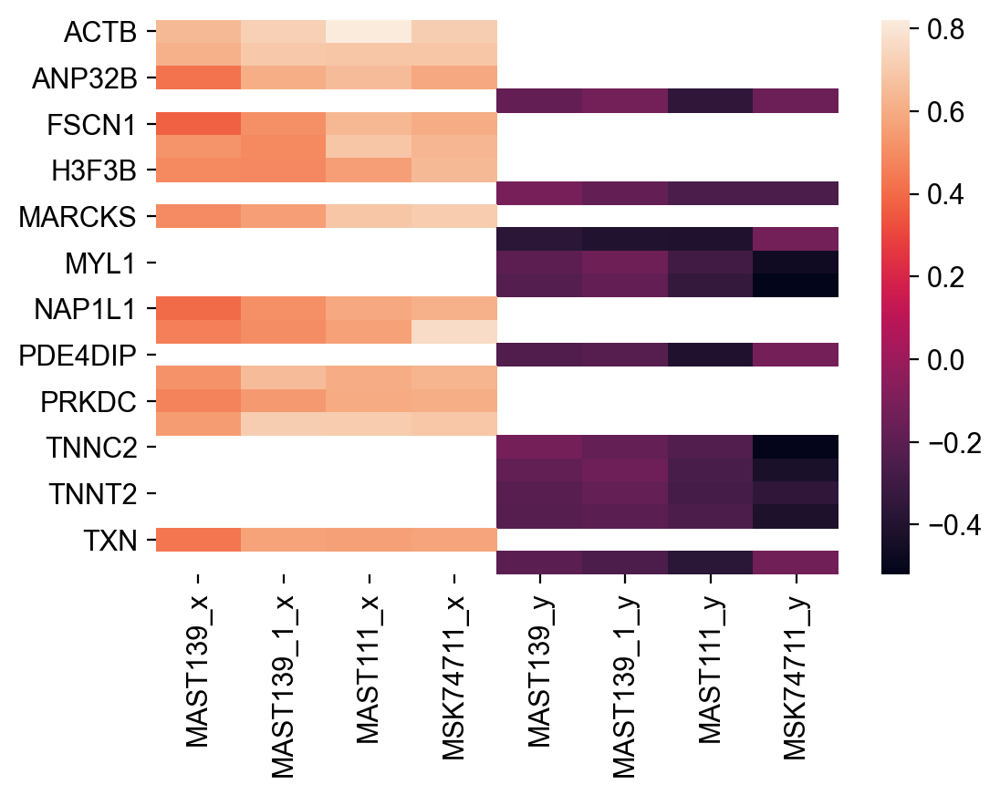

In [167]:
import seaborn as sns
sns.heatmap(corspos['Muscle']['pos'].merge(corspos['Muscle']['neg'], 
                                           left_index=True, right_index=True, how='outer'))

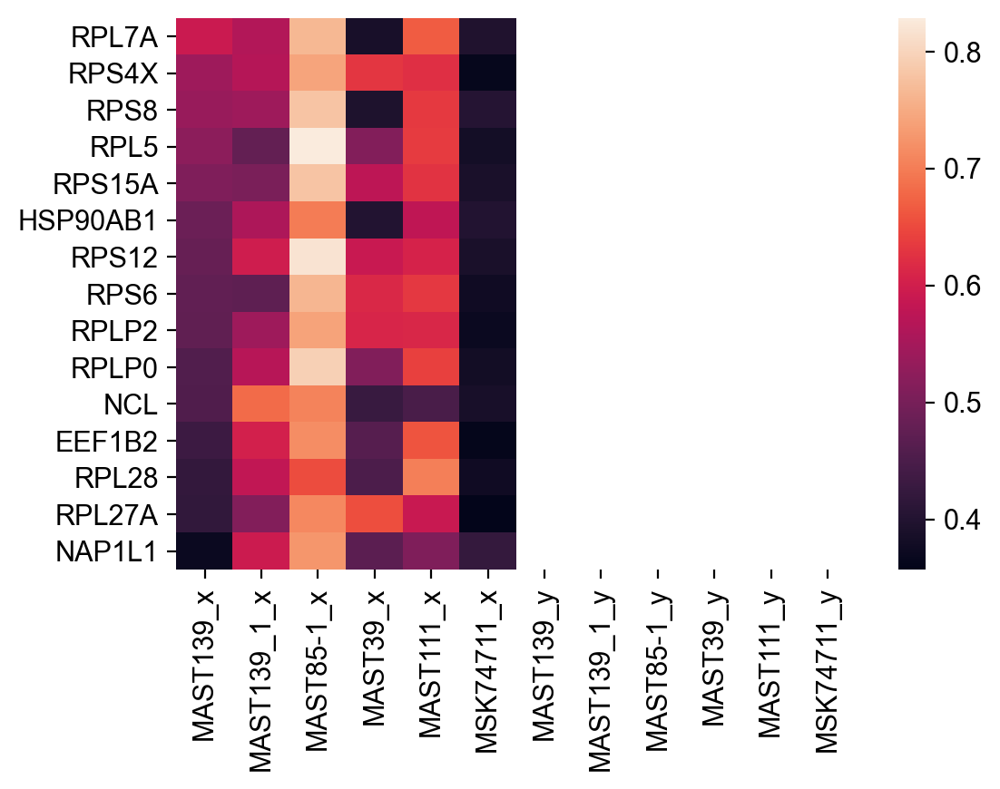

In [168]:
import seaborn as sns
sns.heatmap(corspos['EMT']['pos'].merge(corspos['EMT']['neg'], left_index=True, right_index=True, how='outer'))

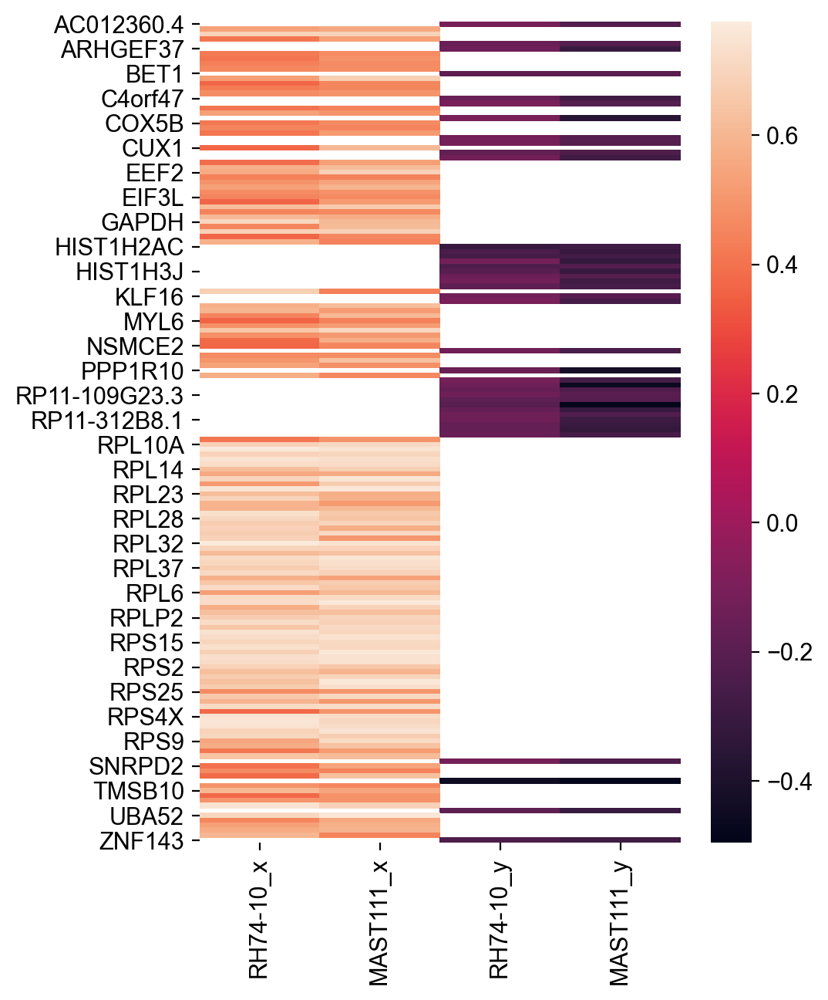

In [169]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
fig.set_size_inches(5, 7)
sns.heatmap(corspos['Apoptosis']['pos'].merge(corspos['Apoptosis']['neg'], 
                                              left_index=True, right_index=True, how='outer'), ax=ax)

In [175]:
from functools import reduce

allpos = []
corspos = {}
for i in cols.columns:
    if i.startswith('Unique'): continue
    corspos[i] = {}        
    cors = []
    ranks_inter = []
    tumor_inter = []
    for d, loom in zip(datas[10:], looms[10:]):
        if i in ranks[d]:
            tumor_inter.append(d)
            ranks_inter.append(list(ranks[d][i].loc[ranks[d][i].pos, :].index))
            cors.append(ranks[d][i].loc[ranks[d][i].pos, :])

    if len(ranks_inter) == 0: continue

    cors = reduce(lambda x, y: pd.merge(x, y, left_index=True, right_index=True, how='inner'), cors)  
    cors = cors.loc[:, cors.columns.str.contains('cyto')]
    cors.columns = tumor_inter
    corspos[i]['pos'] = cors    
    
    if len(ranks_inter) != 1:
        print(i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter)))
        allpos.append([i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter))])
    #else:
    #    print(i, ranks_inter)

Ground MAST95,MAST118,MSK72117,MSK82489 ATRX,BMPR2,CADM2,CLCN5,CUX1,EIF4G3,KCNN3,KCNQ1OT1,MAGI1,MT-CO1,MT-CO2,MT-CO3,MT-ND1,MT-ND3,MT-ND4,MYO18B,NCAM1,NCOA1,NIPBL,PTPRD,RBFOX2,RTN4,SAMD4A,SLC24A3,SSH2,STARD13,TBC1D5,TMEM132D,USP47,WSCD1
Hypoxia MAST95,MSK82489 
Prolif MAST95,MAST118,MSK72117,MSK82489 ATP2B1,CEP128,GPATCH8,MAGI1,PHIP,PTPRD,RBFOX2,SPATS2L,STAG1,TSC22D2
Muscle MAST95,MAST118,MSK72117,MSK82489 ASTN2,CLCN5,MT-ND4,NAV2,NCAM1,NF1,SMYD3,SSH2,TCF12,XRN1
UPR MAST95,MAST118 ADAM12,CNTN5,CSMD1,ELMO1,ERCC8,MBD5,MNAT1,MPPED2,PPAP2A,RBFOX2,REV3L,TCERG1,TSC22D2


In [179]:
!pwd

/PHShome/qq06/projects/02_atlas


In [178]:
pd.DataFrame(allpos).to_csv('allpos_geneset_arms0.1.csv')

In [172]:
from functools import reduce

allneg = []

for i in cols.columns:
    if i.startswith('Unique'): continue
    cors = []
    ranks_inter = []
    tumor_inter = []
    for d, loom in zip(datas[10:], looms[10:]):
        if i in ranks[d]:
            if len(ranks[d][i]) > 0:
                tumor_inter.append(d)
                ranks_inter.append(list(ranks[d][i].loc[~ranks[d][i].pos, :].index))                
                cors.append(ranks[d][i].loc[~ranks[d][i].pos, :])                  
    if len(ranks_inter) == 0: continue
    cors = reduce(lambda x, y: pd.merge(x, y, left_index=True, right_index=True, how='inner'), cors)  
    cors = cors.loc[:, cors.columns.str.contains('cyto')]
    cors.columns = tumor_inter
    print(cors)
    corspos[i]['neg'] = cors      
    if len(ranks_inter) != 1:
        print(i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter)))
        allneg.append([i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter))])
    #else:
    #    print(i, ranks_inter)

Empty DataFrame
Columns: [MAST95, MAST118, MSK72117, MSK82489]
Index: []
Ground MAST95,MAST118,MSK72117,MSK82489 
            MAST95  MSK82489
C21orf58 -0.168819 -0.105414
RYR2     -0.175336 -0.129531
UTRN     -0.182408 -0.137357
Hypoxia MAST95,MSK82489 C21orf58,RYR2,UTRN
             MAST118
Z98049.1   -0.174964
ZDHHC22    -0.174964
GLB1L      -0.174964
AL079342.1 -0.174964
PHKG1      -0.174964
...              ...
SNX18      -0.313748
PTP4A1     -0.324636
NIPSNAP3A  -0.324670
ASB1       -0.331975
CLVS2      -0.333088

[300 rows x 1 columns]
Empty DataFrame
Columns: [MAST95, MAST118, MSK72117, MSK82489]
Index: []
Prolif MAST95,MAST118,MSK72117,MSK82489 
                MAST118
CAMK1         -0.361158
IRF3          -0.361158
RP11-446N19.1 -0.361158
KIAA0753      -0.361158
RP11-686G8.2  -0.361158
...                 ...
CCDC85B       -0.515180
JOSD1         -0.534558
RPL13         -0.554608
SNRPD2        -0.617815
CASC3         -0.695525

[300 rows x 1 columns]
Empty DataFrame
Columns: 

In [176]:
pd.DataFrame(allneg).to_csv('allneg_geneset_arms0.1.csv')

In [315]:
!pwd

/PHShome/qq06/projects/02_atlas


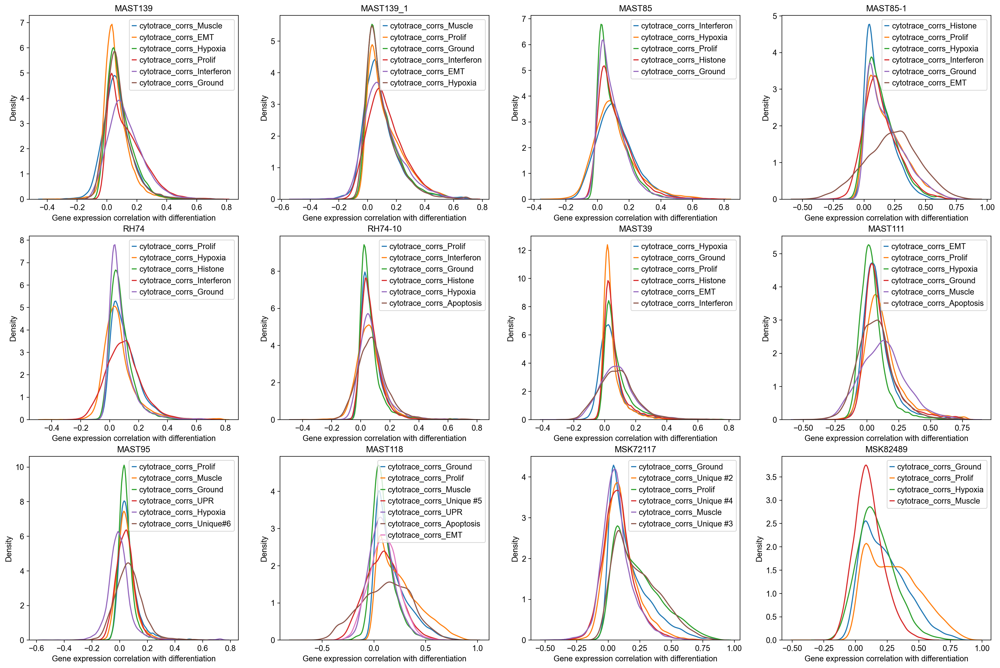

In [289]:
fig, ax = plt.subplots(3, 4)
fig.set_size_inches(24, 16)
ax = ax.flatten()
for j, (d, loom) in enumerate(zip(datas, looms)):
    for i in loom.obs.Phenotype.unique():
        label='_%s' % i
        sns.kdeplot(ranks2[d][i].loc[:, 'cytotrace_corrs%s' % label], ax=ax[j])
        ax[j].set_xlabel('Gene expression correlation with differentiation')
        ax[j].set_ylabel('Density')        
        ax[j].set_title(d)


MAST139 Muscle
MAST139 EMT
MAST139 Hypoxia
MAST139 Prolif
MAST139 Interferon
MAST139 Ground
MAST139_1 Muscle
MAST139_1 Prolif
MAST139_1 Ground
MAST139_1 Interferon
MAST139_1 EMT
MAST139_1 Hypoxia
MAST85 Interferon
MAST85 Hypoxia
MAST85 Prolif
MAST85 Histone
MAST85 Ground
MAST85-1 Histone
MAST85-1 Prolif
MAST85-1 Hypoxia
MAST85-1 Interferon
MAST85-1 Ground
MAST85-1 EMT
RH74 Prolif
RH74 Hypoxia
RH74 Histone
RH74 Interferon
RH74 Ground
RH74-10 Prolif
RH74-10 Interferon
RH74-10 Ground
RH74-10 Histone
RH74-10 Hypoxia
RH74-10 Apoptosis
MAST39 Hypoxia
MAST39 Ground
MAST39 Prolif
MAST39 Histone
MAST39 EMT
MAST39 Interferon
MAST111 EMT
MAST111 Prolif
MAST111 Hypoxia
MAST111 Ground
MAST111 Muscle
MAST111 Apoptosis
MAST95 Prolif
MAST95 Muscle
MAST95 Ground
MAST95 UPR
MAST95 Hypoxia
MAST95 Unique#6
MAST118 Ground
MAST118 Prolif
MAST118 Muscle
MAST118 Unique #5
MAST118 UPR
MAST118 Apoptosis
MAST118 EMT
MSK72117 Ground
MSK72117 Unique #2
MSK72117 Prolif
MSK72117 Unique #4
MSK72117 Muscle
MSK72117 Un

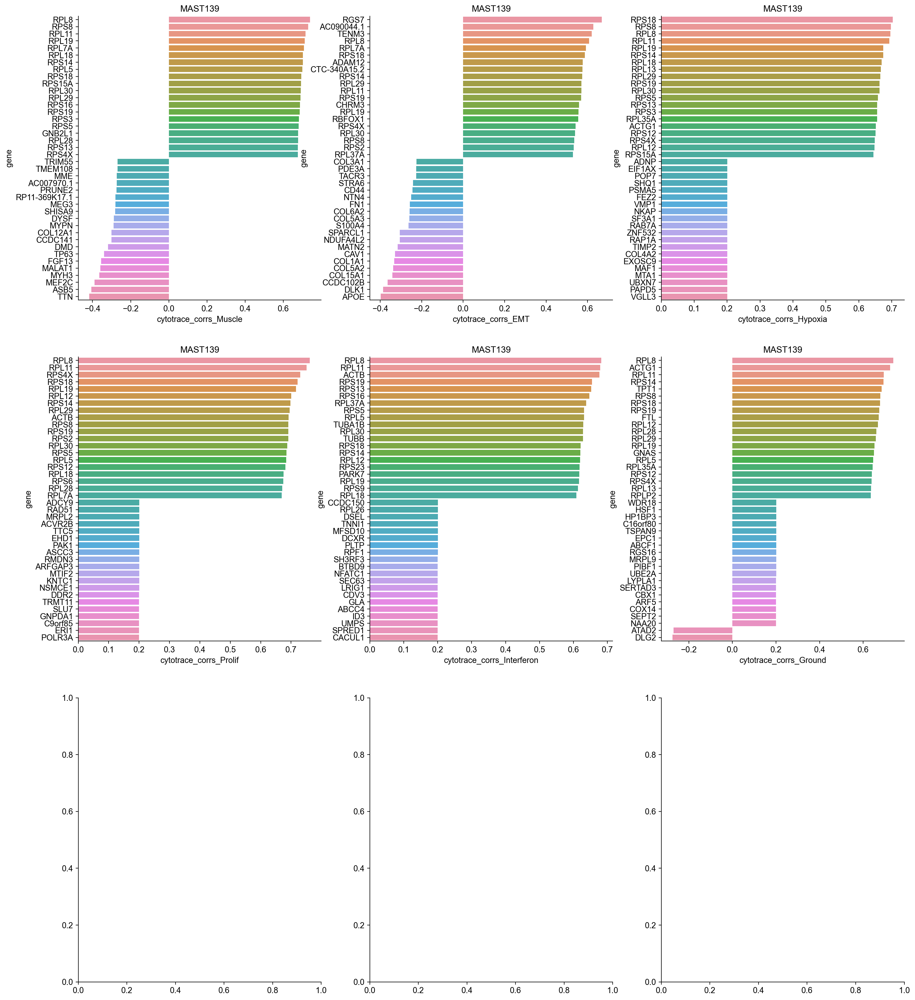

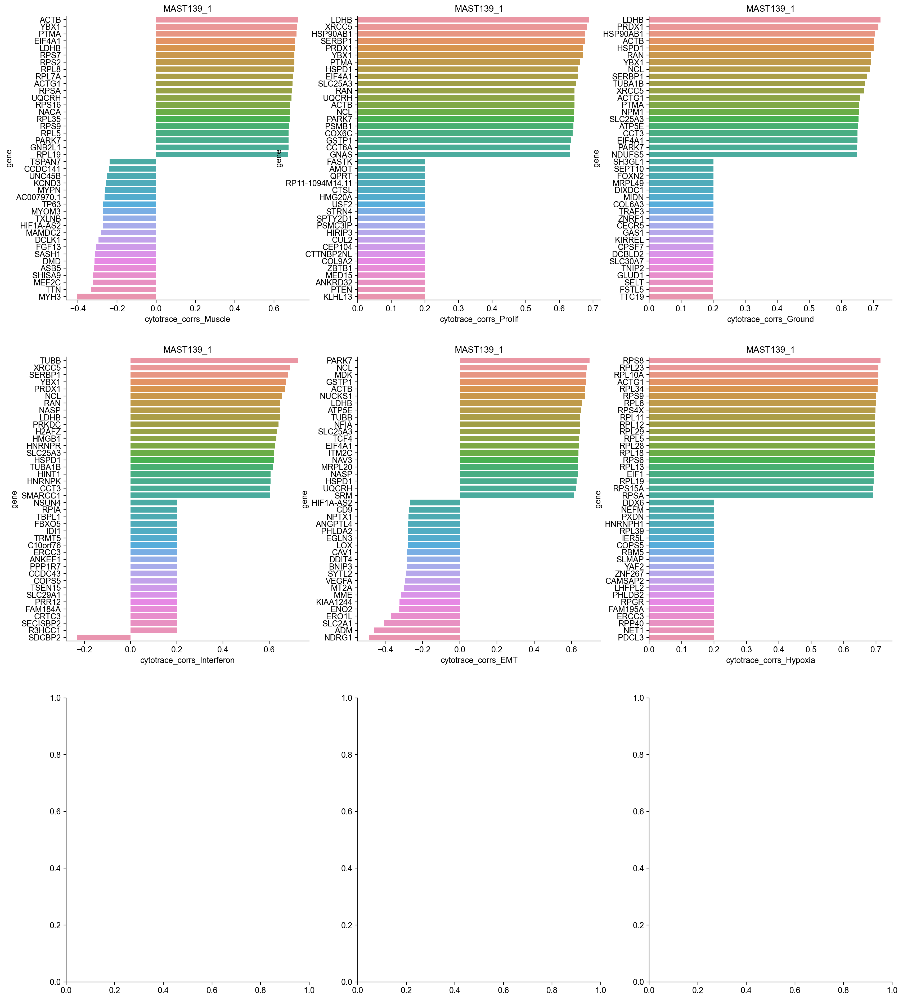

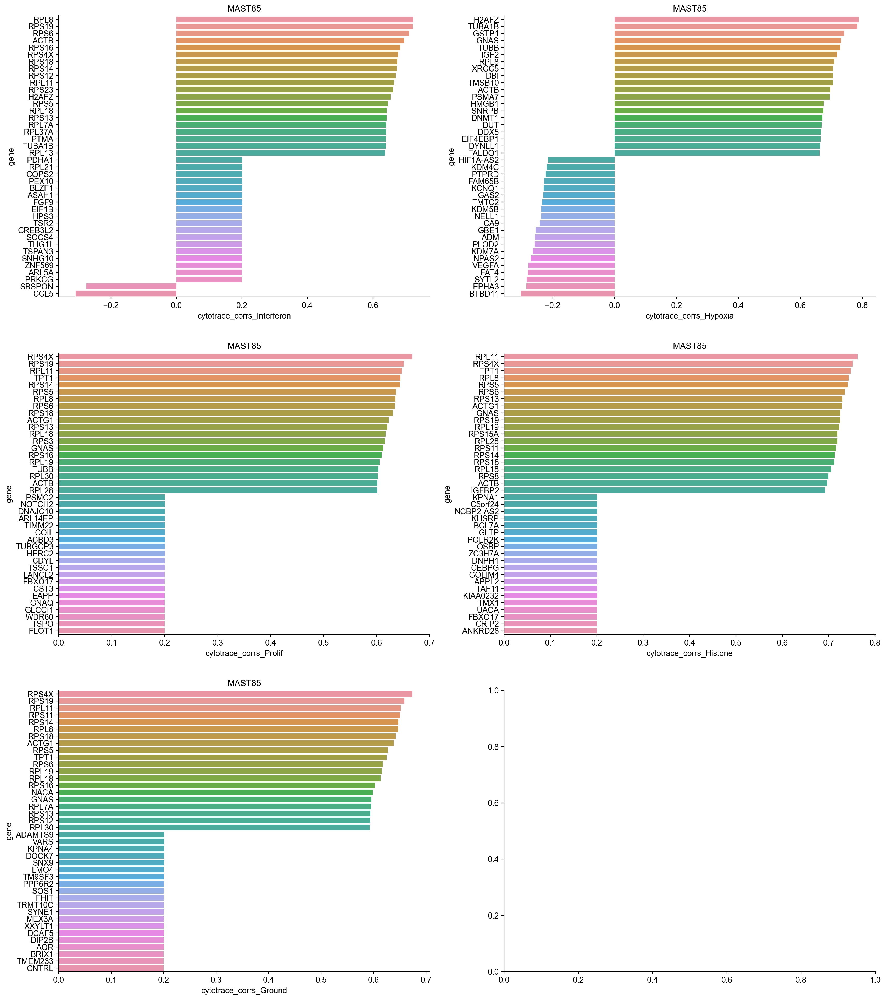

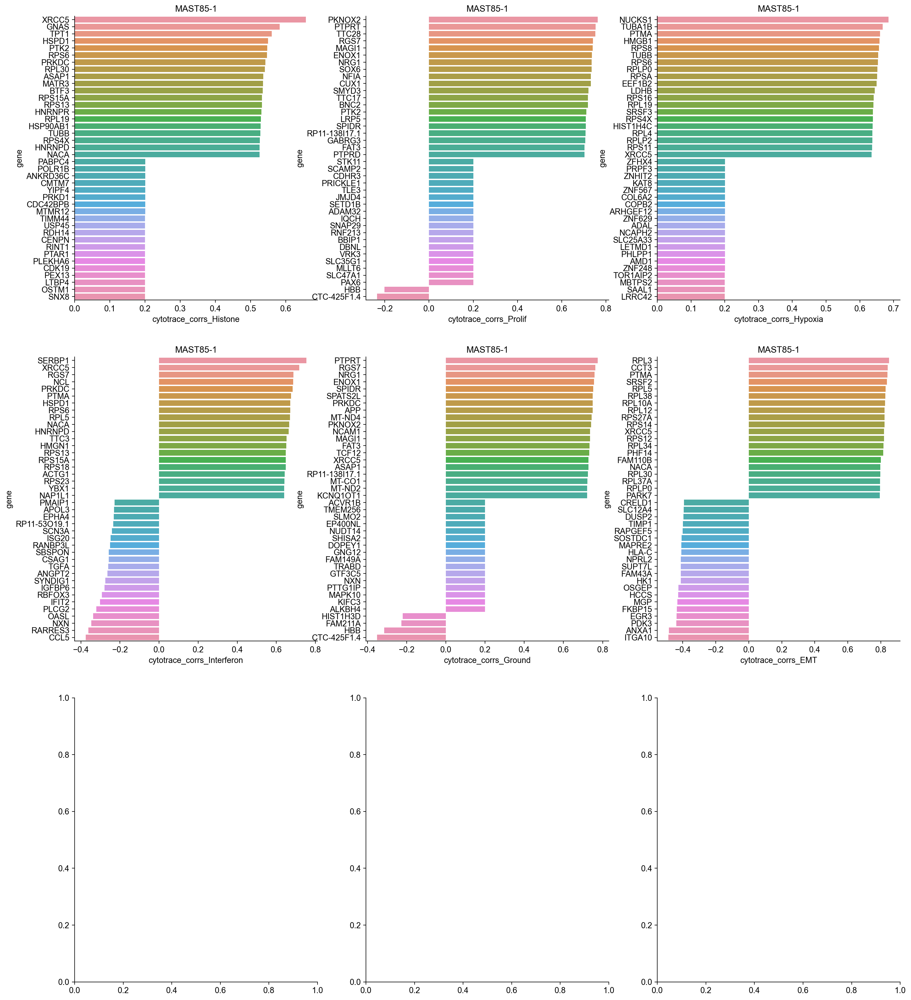

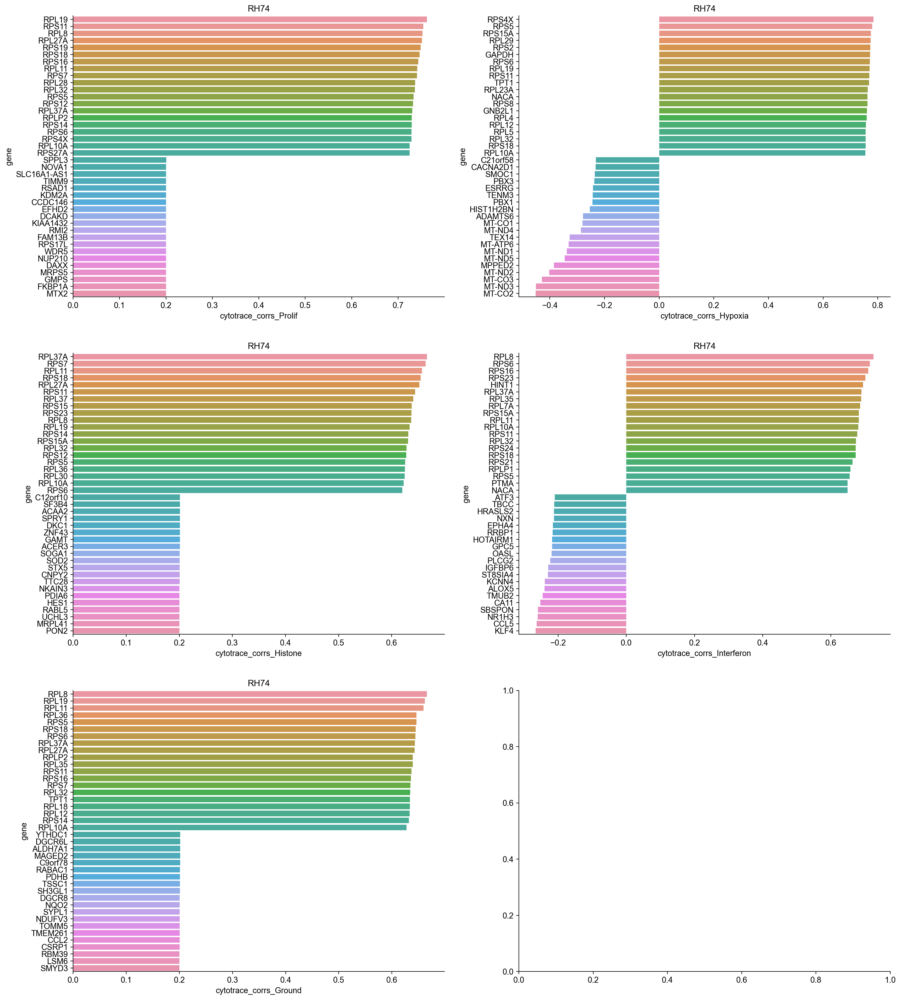

...

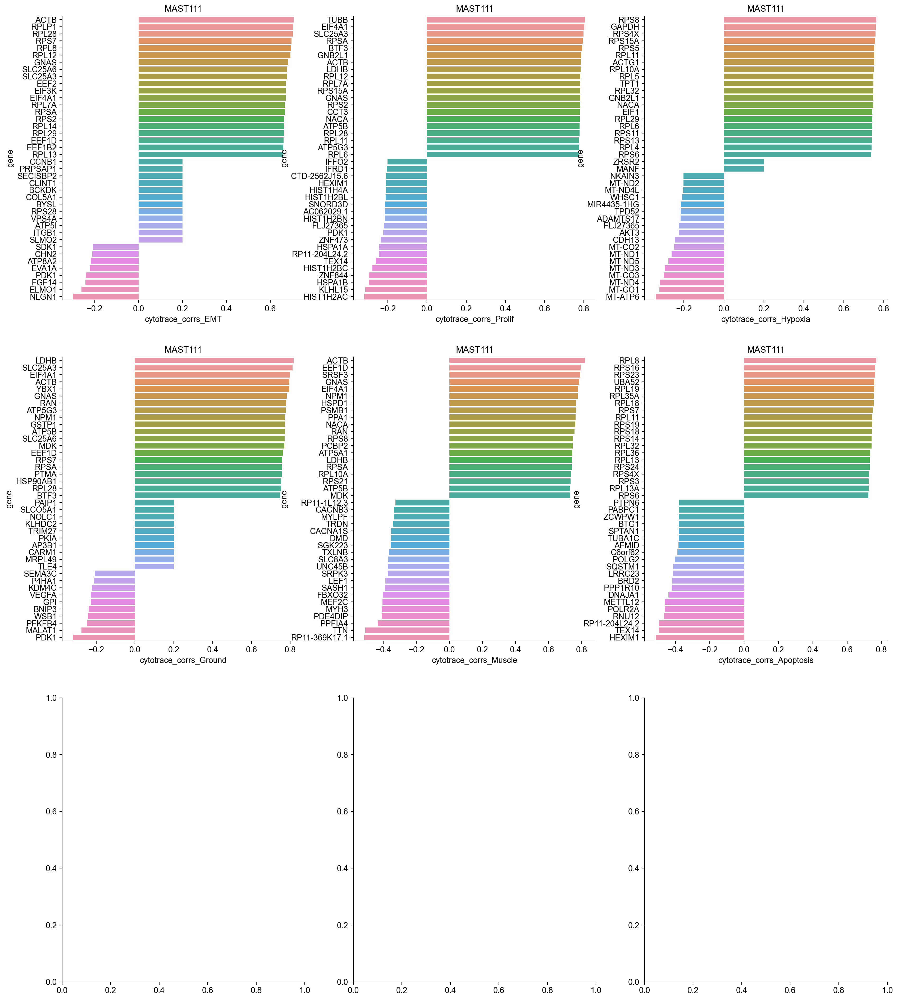

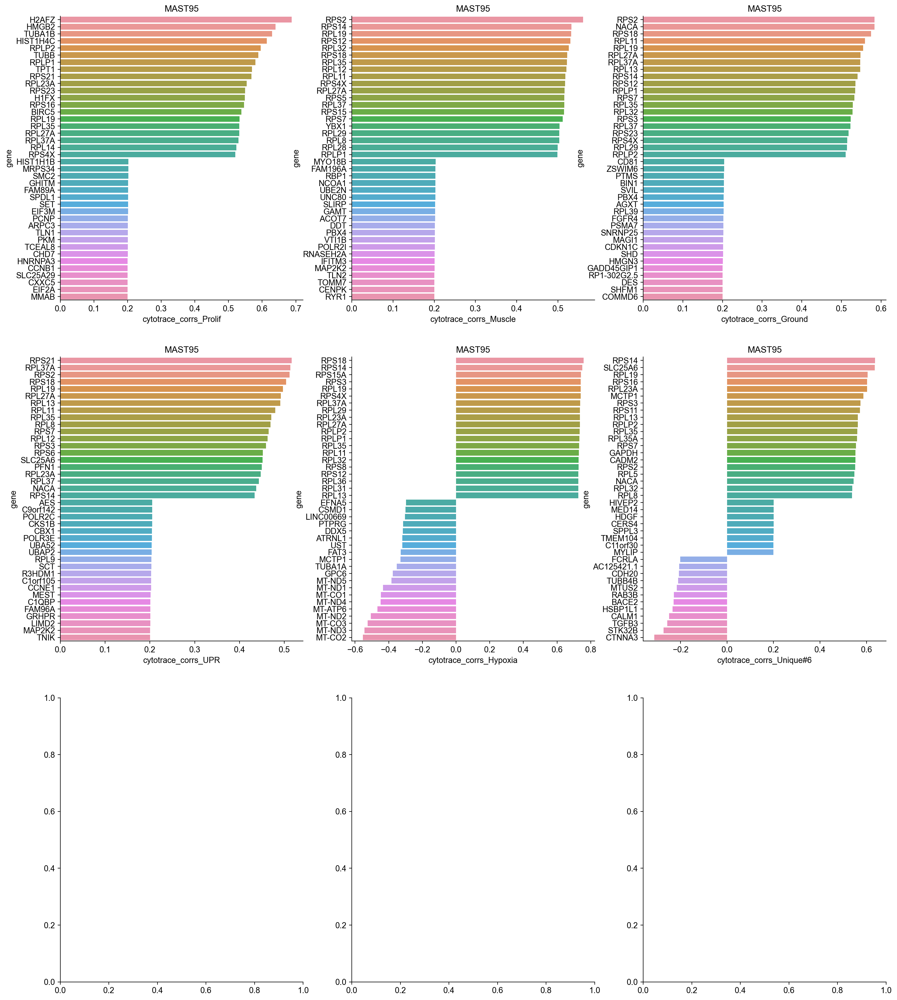

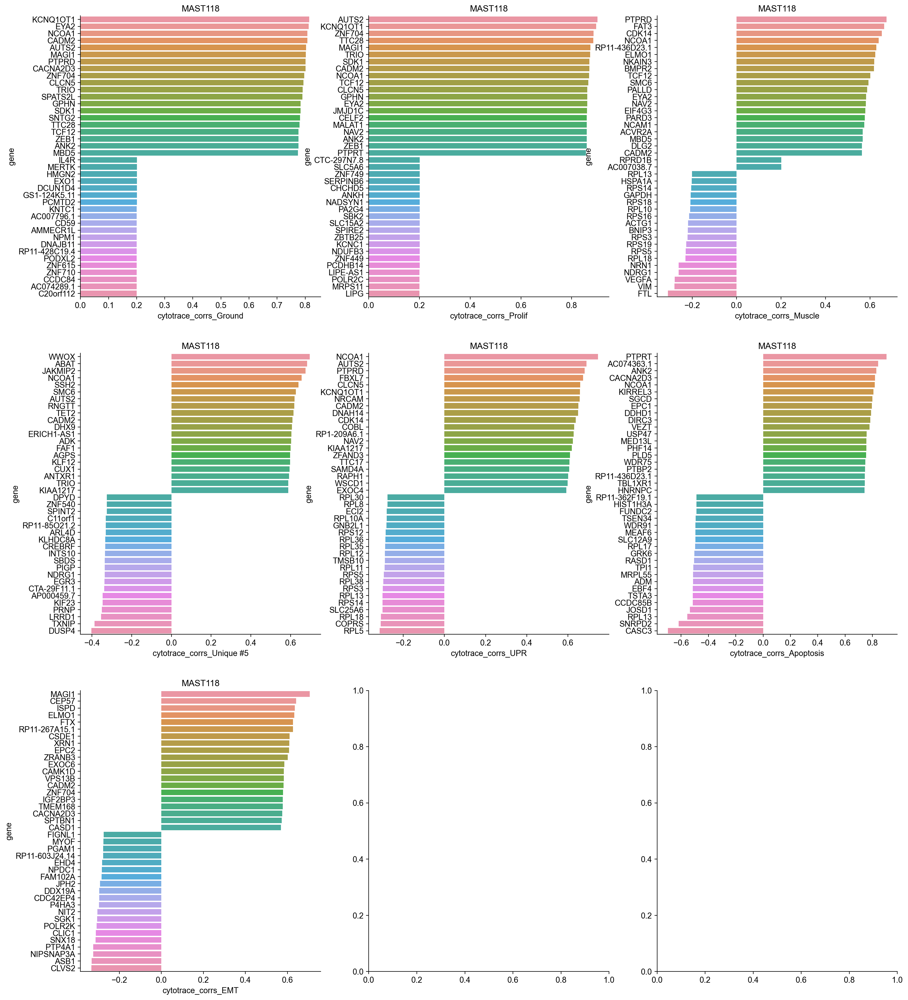

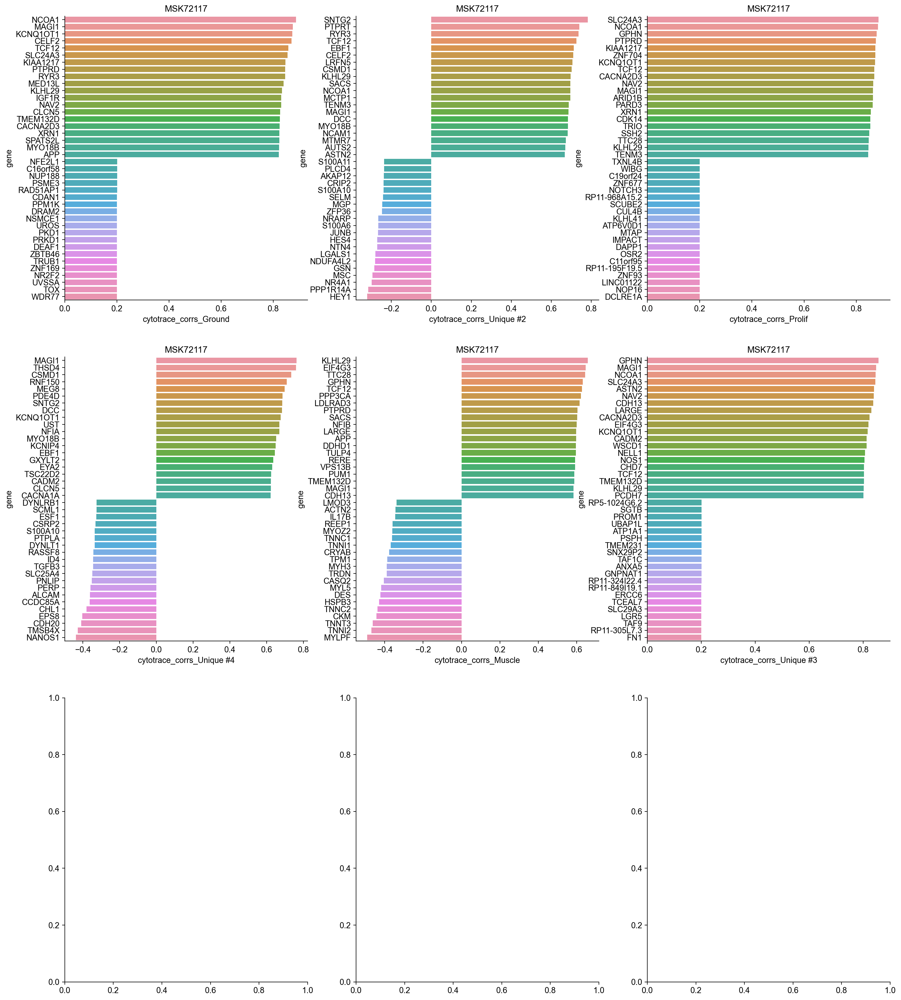

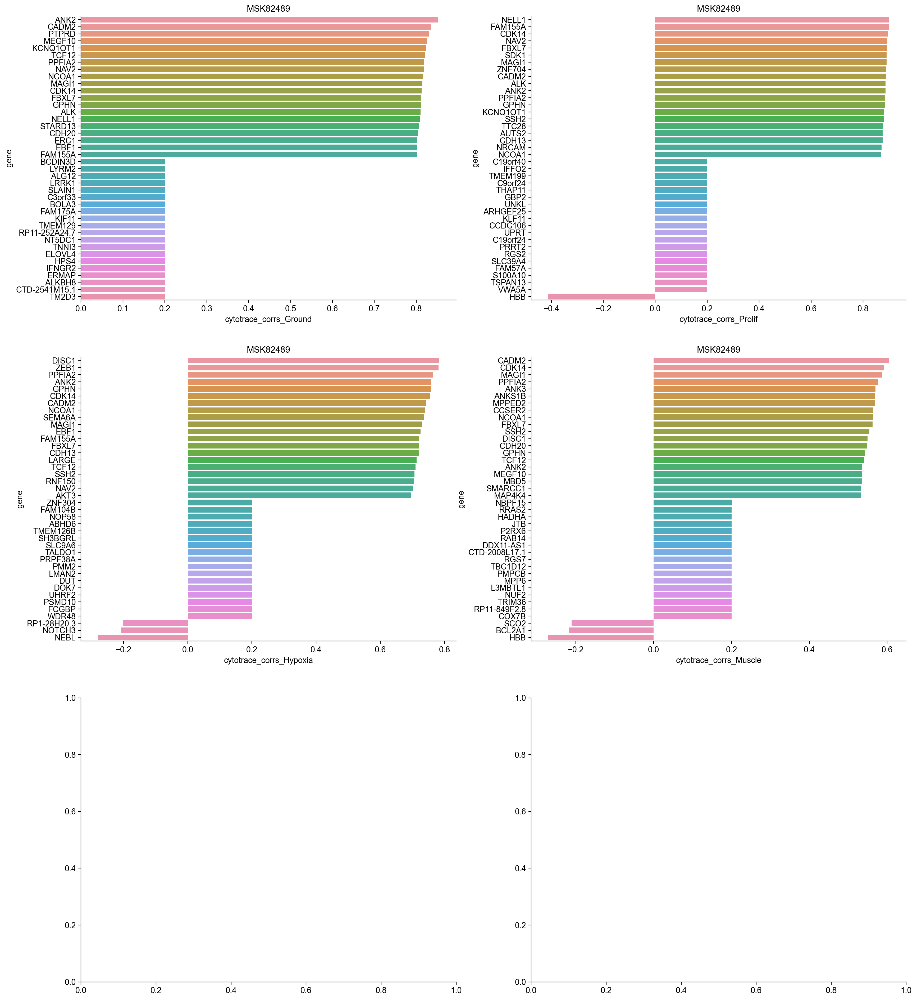

In [307]:
for j, (d, loom) in enumerate(zip(datas, looms)):
    fig, ax = plt.subplots(3, (len(loom.obs.Phenotype.unique())//3+1))
    fig.set_size_inches(20, 24)
    ax = ax.flatten()    
    for z, i in enumerate(loom.obs.Phenotype.unique()):
        rank = ranks[d][i]
        print(d, i)
        label='_%s' % i
        ranks_plot = pd.concat([rank.iloc[:20], rank.iloc[-20:]], axis=0)
        sns.barplot(y="gene", x='cytotrace_corrs%s' % label, data=ranks_plot, ax=ax[z])
        sns.despine()
        ax[z].set_title(d)
#         ax[z].set_xticklabels(order,
#                               rotation=40, ha='right')         
        #break
        
#    break

### Gene ontology by enrichr

In [8]:
import gseapy as gp

In [16]:
results_pos = []

In [19]:
for d, loom in zip(datas, looms):
    for i in loom.obs.Phenotype.unique():        
        rank = ranks[d][i]    
        rank = rank.loc[rank.pos, :]
        print(rank.shape)
        pre_res = gp.enrichr(list(rank.index), #[:300],
                             gene_sets=glob('/PHShome/qq06/langenau/01_rms_projects/02_human/data/msigdb/c[25]*gmt')+\
                             ['/PHShome/qq06/langenau/01_rms_projects/02_human/data/msigdb/h.all.v7.0.symbols.gmt',
                              'KEGG_2019_Human'], #'GO_Biological_Process_2018','GO_Cellular_Component_2018', 'GO_Molecular_Function_2018'], #  'MSigDB_Oncogenic_Signatures', 
                         outdir='test/prerank_report_kegg', format='png')
        result = pre_res.results
        result = result.sort_values('Adjusted P-value', ascending=True)
        result = result.loc[result.loc[:, 'Adjusted P-value'] <= 0.01,:]
        result.loc[:, 'tumor'] = d
        result.loc[:, 'cell_state'] = i
        results_pos.append(result)
        print(d, i)

(141, 3)
MAST139 Muscle
(167, 3)
MAST139 EMT
(200, 3)
MAST139 Hypoxia
(200, 3)
MAST139 Prolif
(200, 3)
MAST139 Interferon
(198, 3)
MAST139 Ground
(148, 3)
MAST139_1 Muscle
(200, 3)
MAST139_1 Prolif
(200, 3)
MAST139_1 Ground
(199, 3)
MAST139_1 Interferon
(151, 3)
MAST139_1 EMT
(200, 3)
MAST139_1 Hypoxia
(198, 3)
MAST85 Interferon
(168, 3)
MAST85 Hypoxia
(200, 3)
MAST85 Prolif
(200, 3)
MAST85 Histone
(200, 3)
MAST85 Ground
(200, 3)
MAST85-1 Histone
(198, 3)


2020-06-25 22:38:34,461 Warning: No enrich terms using library CUSTOM139841899168032 when cutoff = 0.05


MAST85-1 Prolif
(200, 3)
MAST85-1 Hypoxia
(170, 3)
MAST85-1 Interferon
(196, 3)


2020-06-25 22:39:01,818 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MAST85-1 Ground
(100, 3)
MAST85-1 EMT
(200, 3)
RH74 Prolif
(166, 3)
RH74 Hypoxia
(200, 3)
RH74 Histone
(170, 3)
RH74 Interferon
(200, 3)
RH74 Ground
(200, 3)
RH74-10 Prolif
(140, 3)
RH74-10 Interferon
(200, 3)
RH74-10 Ground
(200, 3)
RH74-10 Histone
(198, 3)
RH74-10 Hypoxia
(184, 3)
RH74-10 Apoptosis
(197, 3)
MAST39 Hypoxia
(200, 3)
MAST39 Ground
(198, 3)
MAST39 Prolif
(199, 3)
MAST39 Histone
(182, 3)
MAST39 EMT
(178, 3)
MAST39 Interferon
(192, 3)
MAST111 EMT
(180, 3)
MAST111 Prolif
(182, 3)
MAST111 Hypoxia
(190, 3)
MAST111 Ground
(100, 3)
MAST111 Muscle
(100, 3)
MAST111 Apoptosis
(200, 3)
MAST95 Prolif
(200, 3)
MAST95 Muscle
(200, 3)
MAST95 Ground
(200, 3)
MAST95 UPR
(100, 3)
MAST95 Hypoxia
(188, 3)
MAST95 Unique#6
(200, 3)


2020-06-25 22:43:52,149 Warning: No enrich terms using library CUSTOM139841731949336 when cutoff = 0.05
2020-06-25 22:43:54,547 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MAST118 Ground
(200, 3)


2020-06-25 22:43:59,046 Warning: No enrich terms using library CUSTOM139841944182504 when cutoff = 0.05


MAST118 Prolif
(182, 3)
MAST118 Muscle
(100, 3)


2020-06-25 22:44:15,442 Warning: No enrich terms using library CUSTOM139841948865160 when cutoff = 0.05
2020-06-25 22:44:16,704 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MAST118 Unique #5
(100, 3)


2020-06-25 22:44:21,022 Warning: No enrich terms using library CUSTOM139841899360976 when cutoff = 0.05
2020-06-25 22:44:22,302 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MAST118 UPR
(100, 3)


2020-06-25 22:44:27,424 Warning: No enrich terms using library CUSTOM139841955371048 when cutoff = 0.05
2020-06-25 22:44:28,700 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MAST118 Apoptosis
(100, 3)


2020-06-25 22:44:34,794 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MAST118 EMT
(200, 3)


2020-06-25 22:44:38,393 Warning: No enrich terms using library CUSTOM139841885660360 when cutoff = 0.05
2020-06-25 22:44:38,452 Warning: No enrich terms using library CUSTOM139841731038736 when cutoff = 0.05
2020-06-25 22:44:39,933 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MSK72117 Ground
(163, 3)


2020-06-25 22:44:45,414 Warning: No enrich terms using library CUSTOM139841983575888 when cutoff = 0.05
2020-06-25 22:44:46,776 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MSK72117 Unique #2
(200, 3)


2020-06-25 22:44:50,615 Warning: No enrich terms using library CUSTOM139841901826480 when cutoff = 0.05
2020-06-25 22:44:53,081 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MSK72117 Prolif
(100, 3)
MSK72117 Unique #4
(100, 3)
MSK72117 Muscle
(200, 3)


2020-06-25 22:45:17,744 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MSK72117 Unique #3
(200, 3)


2020-06-25 22:45:23,446 Warning: No enrich terms using library CUSTOM139841799050512 when cutoff = 0.05
2020-06-25 22:45:24,970 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MSK82489 Ground
(199, 3)


2020-06-25 22:45:29,311 Warning: No enrich terms using library CUSTOM139841786077048 when cutoff = 0.05
2020-06-25 22:45:29,375 Warning: No enrich terms using library CUSTOM139841899299968 when cutoff = 0.05
2020-06-25 22:45:30,881 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MSK82489 Prolif
(197, 3)


2020-06-25 22:45:38,376 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MSK82489 Hypoxia
(197, 3)


2020-06-25 22:45:43,656 Warning: No enrich terms using library CUSTOM139841952758376 when cutoff = 0.05
2020-06-25 22:45:45,140 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


MSK82489 Muscle


In [20]:
result_all = pd.concat(results_pos)

In [21]:
result_tmp = result_all.loc[result_all.tumor=='MAST139', :]
result_tmp.loc[:, ['tumor', 'Term', 'Overlap',
                   'Adjusted P-value', 'cell_state']].groupby(['tumor', 'cell_state']).head(5)

,tumor,Term,Overlap,Adjusted P-value,cell_state
744,MAST139,KEGG_RIBOSOME,55/88,1.153578e-95,Muscle
1602,MAST139,REACTOME_NONSENSE_MEDIATED_DECAY_NMD_INDEPENDE...,56/96,2.578086e-95,Muscle
1427,MAST139,REACTOME_EUKARYOTIC_TRANSLATION_INITIATION,59/120,7.612693e-95,Muscle
1762,MAST139,REACTOME_SRP_DEPENDENT_COTRANSLATIONAL_PROTEIN...,56/113,5.416380e-90,Muscle
2672,MAST139,GO_COTRANSLATIONAL_PROTEIN_TARGETING_TO_MEMBRANE,55/104,1.039206e-89,Muscle
769,MAST139,KEGG_RIBOSOME,46/88,1.113359e-69,EMT
1579,MAST139,REACTOME_NONSENSE_MEDIATED_DECAY_NMD_INDEPENDE...,46/96,1.307672e-67,EMT
2664,MAST139,GO_COTRANSLATIONAL_PROTEIN_TARGETING_TO_MEMBRANE,47/104,3.090383e-67,EMT
1438,MAST139,REACTOME_EUKARYOTIC_TRANSLATION_INITIATION,48/120,4.570923e-66,EMT
1732,MAST139,REACTOME_SRP_DEPENDENT_COTRANSLATIONAL_PROTEIN...,47/113,1.010884e-65,EMT


In [205]:
results_neg = []
for d, loom in zip(datas, looms):
    for i in loom.obs.Phenotype.unique():
        label='_%s' % i
        rank = pd.DataFrame(loom.var.sort_values('cytotrace_corrs%s' % label,
                                                 ascending=False).loc[:, 'cytotrace_corrs%s' % label])
        rank = rank.loc[rank.loc[:, 'cytotrace_corrs%s' % label]!='None', :]        
        rank.insert(loc=0, column='gene', value=rank.index)    
        rank = rank.sort_values('cytotrace_corrs%s' % label, ascending=False)
        rank = rank.loc[rank.loc[:, 'cytotrace_corrs%s' % label].astype('float32')<=-0.2, :]
        rank = rank.dropna()
        
        print(rank.shape)
        if rank.shape[0]==0: continue
        pre_res = gp.enrichr(list(rank.index),                          
                             gene_sets=glob('/PHShome/qq06/langenau/01_rms_projects/02_human/data/msigdb/c[25]*gmt')+\
                             ['/PHShome/qq06/langenau/01_rms_projects/02_human/data/msigdb/h.all.v7.0.symbols.gmt',
                              'KEGG_2019_Human','GO_Biological_Process_2018', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019',
                              'GO_Cellular_Component_2018', 'GO_Molecular_Function_2018'], #  'MSigDB_Oncogenic_Signatures', 
                         outdir='test/prerank_report_kegg', format='png')
        result = pre_res.results
        print(result.shape)
        result = result.sort_values('Adjusted P-value', ascending=True)
        result = result.loc[result.loc[:, 'Adjusted P-value'] <= 0.01,:]
        if result.shape[0] == 0: continue
        result.loc[:, 'tumor'] = d            
        result.loc[:, 'cell_state'] = i
        results_neg.append(result)
        print(i)

(59, 2)


2020-06-19 09:27:05,127 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05


(3814, 10)
Muscle
(33, 2)


2020-06-19 09:27:20,081 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05


(3607, 10)
EMT
(0, 2)
(0, 2)
(0, 2)
(2, 2)


2020-06-19 09:27:28,790 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:27:29,894 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:27:30,993 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:27:32,096 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:27:33,201 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(295, 10)
(52, 2)


2020-06-19 09:27:42,284 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:27:43,432 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05


(3561, 10)
Muscle
(0, 2)
(0, 2)
(1, 2)


2020-06-19 09:27:48,862 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:27:49,963 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:27:51,077 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:27:52,176 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:27:53,283 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(42, 10)
(49, 2)


2020-06-19 09:28:04,081 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:28:07,070 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(5030, 10)
EMT
(0, 2)
(2, 2)


2020-06-19 09:28:11,886 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:28:13,008 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:28:14,120 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:28:15,224 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:28:16,323 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(647, 10)
(32, 2)


2020-06-19 09:28:21,912 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:28:24,999 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:28:26,125 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:28:27,257 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(3105, 10)
Hypoxia
(0, 2)
(0, 2)
(0, 2)
(0, 2)
(2, 2)


2020-06-19 09:28:31,671 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:28:32,776 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:28:33,871 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:28:34,967 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:28:36,065 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(192, 10)
(0, 2)
(30, 2)


2020-06-19 09:28:41,224 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:28:44,430 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:28:45,561 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:28:46,689 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(2837, 10)
Interferon
(4, 2)


2020-06-19 09:28:47,101 Warning: No enrich terms using library CUSTOM140650674572456 when cutoff = 0.05
2020-06-19 09:28:49,964 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:28:51,076 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:28:52,177 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:28:53,277 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:28:54,383 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(334, 10)
(418, 2)


2020-06-19 09:28:57,959 Warning: No enrich terms using library CUSTOM140647709605320 when cutoff = 0.05
2020-06-19 09:29:00,811 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:29:02,466 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:29:04,009 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:29:05,477 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:29:07,048 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(10067, 10)
EMT
(0, 2)
(34, 2)


2020-06-19 09:29:10,862 Warning: No enrich terms using library CUSTOM140647974630960 when cutoff = 0.05
2020-06-19 09:29:12,049 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:29:15,482 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05


(2969, 10)
Hypoxia
(0, 2)
(30, 2)


2020-06-19 09:29:21,562 Warning: No enrich terms using library CUSTOM140644371901752 when cutoff = 0.05
2020-06-19 09:29:25,458 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:29:26,738 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:29:27,857 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:29:29,004 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(3066, 10)
Interferon
(0, 2)
(0, 2)
(60, 2)


2020-06-19 09:29:34,592 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:29:37,916 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:29:40,975 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(5003, 10)
Interferon
(0, 2)
(0, 2)
(2, 2)


2020-06-19 09:29:51,388 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05


(656, 10)
Hypoxia
(16, 2)


2020-06-19 09:29:58,543 Warning: No enrich terms using library CUSTOM140647040580992 when cutoff = 0.05
2020-06-19 09:30:01,492 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:30:02,753 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:30:03,886 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:30:05,005 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(1507, 10)
Apoptosis
(3, 2)


2020-06-19 09:30:10,214 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:30:13,286 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05


(636, 10)
Hypoxia
(0, 2)
(2, 2)


2020-06-19 09:30:21,440 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:30:22,625 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:30:23,724 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:30:24,821 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:30:25,923 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(191, 10)
(1, 2)


2020-06-19 09:30:30,808 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:30:31,921 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:30:33,022 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:30:34,121 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:30:35,219 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(570, 10)
Histone
(18, 2)


2020-06-19 09:30:40,316 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:30:43,376 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:30:46,330 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(1284, 10)
EMT
(22, 2)


2020-06-19 09:30:46,761 Warning: No enrich terms using library CUSTOM140644362707304 when cutoff = 0.05
2020-06-19 09:30:46,990 Warning: No enrich terms using library CUSTOM140644362708528 when cutoff = 0.05
2020-06-19 09:30:47,029 Warning: No enrich terms using library CUSTOM140648175697640 when cutoff = 0.05
2020-06-19 09:30:48,171 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:30:49,309 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:30:50,452 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:30:51,601 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:30:52,726 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(1181, 10)
(8, 2)


2020-06-19 09:30:55,322 Warning: No enrich terms using library CUSTOM140648172163008 when cutoff = 0.05
2020-06-19 09:30:56,439 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:30:57,565 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:30:58,680 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:30:59,787 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:31:00,897 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(901, 10)
(20, 2)


2020-06-19 09:31:04,522 Warning: No enrich terms using library CUSTOM140648590286920 when cutoff = 0.05
2020-06-19 09:31:09,914 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:31:11,039 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05


(1665, 10)
Prolif
(18, 2)


2020-06-19 09:31:16,441 Warning: No enrich terms using library CUSTOM140648345239984 when cutoff = 0.05
2020-06-19 09:31:17,575 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:31:20,854 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05


(881, 10)
Hypoxia
(10, 2)


2020-06-19 09:31:31,057 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:31:32,209 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:31:33,335 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:31:34,443 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:31:35,552 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(2001, 10)
Ground
(316, 2)


2020-06-19 09:31:42,143 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:31:45,890 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:31:47,302 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:31:48,739 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(8402, 10)
Muscle
(296, 2)


2020-06-19 09:31:58,489 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:31:59,839 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:32:01,180 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:32:02,533 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(9656, 10)
Apoptosis
(0, 2)
(0, 2)
(0, 2)
(0, 2)
(133, 2)


2020-06-19 09:32:13,189 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05


(6767, 10)
Hypoxia
(12, 2)


2020-06-19 09:32:23,704 Warning: No enrich terms using library CUSTOM140649928628408 when cutoff = 0.05
2020-06-19 09:32:23,742 Warning: No enrich terms using library CUSTOM140647761805744 when cutoff = 0.05
2020-06-19 09:32:24,883 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:32:26,028 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:32:27,145 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:32:28,253 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:32:29,362 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(1712, 10)
(0, 2)
(0, 2)
(18, 2)


2020-06-19 09:32:38,678 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05


(2767, 10)
Muscle
(544, 2)


2020-06-19 09:32:55,993 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05


(11753, 10)
Unique #5
(131, 2)


2020-06-19 09:33:11,004 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05


(5266, 10)
UPR
(1178, 2)
(16240, 10)
Apoptosis
(158, 2)


2020-06-19 09:33:42,270 Warning: No enrich terms using library CUSTOM140647961858840 when cutoff = 0.05
2020-06-19 09:33:43,123 Warning: No enrich terms using library CUSTOM140647961859128 when cutoff = 0.05
2020-06-19 09:33:43,172 Warning: No enrich terms using library CUSTOM140644387303144 when cutoff = 0.05
2020-06-19 09:33:44,566 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:33:45,909 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:33:47,178 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:33:48,428 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:33:49,675 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(5983, 10)
(0, 2)
(37, 2)


2020-06-19 09:33:55,571 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:33:56,771 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:33:57,931 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:33:59,055 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:34:00,193 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(3942, 10)
Unique #2
(0, 2)
(115, 2)


2020-06-19 09:34:03,111 Warning: No enrich terms using library CUSTOM140647039721760 when cutoff = 0.05
2020-06-19 09:34:03,161 Warning: No enrich terms using library CUSTOM140642896950616 when cutoff = 0.05
2020-06-19 09:34:04,496 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:34:05,784 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:34:07,087 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:34:08,311 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:34:09,531 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(6294, 10)
Unique #4
(167, 2)


2020-06-19 09:34:20,708 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05


(7583, 10)
Muscle
(0, 2)
(0, 2)
(1, 2)


2020-06-19 09:34:29,223 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:34:30,351 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:34:31,467 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:34:32,591 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:34:33,706 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(192, 10)
(3, 2)


2020-06-19 09:34:38,346 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:34:39,457 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:34:40,552 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:34:41,655 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:34:42,751 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(236, 10)
Hypoxia
(3, 2)


2020-06-19 09:34:47,043 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
2020-06-19 09:34:48,152 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2020-06-19 09:34:49,254 Warning: No enrich terms using library DepMap_WG_CRISPR_Screens_Broad_CellLines_2019 when cutoff = 0.05
2020-06-19 09:34:50,354 Warning: No enrich terms using library GO_Cellular_Component_2018 when cutoff = 0.05
2020-06-19 09:34:51,449 Warning: No enrich terms using library GO_Molecular_Function_2018 when cutoff = 0.05


(446, 10)
Muscle


In [206]:
results_neg = pd.concat(results_neg)
results_neg.loc[:, ['Term', 'Overlap', 'Adjusted P-value', 'cell_state']].groupby('cell_state').head(8)

,Term,Overlap,Adjusted P-value,cell_state
1790,GO_MUSCLE_STRUCTURE_DEVELOPMENT,20/659,6.268622e-12,Muscle
1383,GO_CONTRACTILE_FIBER,13/229,1.686586e-10,Muscle
2632,GO_SARCOMERE_ORGANIZATION,8/49,1.226329e-09,Muscle
1777,GO_MUSCLE_CELL_DEVELOPMENT,11/184,4.124349e-09,Muscle
2813,HALLMARK_MYOGENESIS,10/200,5.764895e-09,Muscle
...,...,...,...,...
728,NAGASHIMA_EGF_SIGNALING_UP,6/57,3.073946e-07,Unique #2
592,LINDGREN_BLADDER_CANCER_CLUSTER_2B,10/388,5.059102e-07,Unique #2
96,BOQUEST_STEM_CELL_UP,8/262,5.835944e-06,Unique #2
22,AMIT_DELAYED_EARLY_GENES,4/18,5.855418e-06,Unique #2


In [311]:
result_tmp = results_neg.loc[results_neg.tumor=='MAST139', :]
result_tmp.loc[:, ['tumor', 'Term', 'Overlap',
                   'Adjusted P-value', 'cell_state']].groupby(['tumor', 'cell_state']).head(5)

,tumor,Term,Overlap,Adjusted P-value,cell_state
1790,MAST139,GO_MUSCLE_STRUCTURE_DEVELOPMENT,20/659,6.268622e-12,Muscle
1383,MAST139,GO_CONTRACTILE_FIBER,13/229,1.686586e-10,Muscle
2632,MAST139,GO_SARCOMERE_ORGANIZATION,8/49,1.226329e-09,Muscle
1777,MAST139,GO_MUSCLE_CELL_DEVELOPMENT,11/184,4.124349e-09,Muscle
2813,MAST139,HALLMARK_MYOGENESIS,10/200,5.764895e-09,Muscle
1442,MAST139,GO_COLLAGEN_CONTAINING_EXTRACELLULAR_MATRIX,17/406,3.590219e-17,EMT
1552,MAST139,GO_EXTRACELLULAR_MATRIX,18/524,3.590219e-17,EMT
603,MAST139,NABA_CORE_MATRISOME,15/275,1.642567e-16,EMT
953,MAST139,SCHUETZ_BREAST_CANCER_DUCTAL_INVASIVE_UP,15/352,2.356669e-15,EMT
144,MAST139,CHICAS_RB1_TARGETS_CONFLUENT,17/563,2.356669e-15,EMT


In [312]:
result_tmp = results_neg.loc[results_neg.tumor=='MSK82489', :]
result_tmp.loc[:, ['tumor', 'Term', 'Overlap',
                   'Adjusted P-value', 'cell_state']].groupby(['tumor', 'cell_state']).head(5)

,tumor,Term,Overlap,Adjusted P-value,cell_state
199,MSK82489,HALLMARK_NOTCH_SIGNALING,1/32,0.005034,Hypoxia
82,MSK82489,MCLACHLAN_DENTAL_CARIES_UP,3/265,0.000416,Muscle


### Explore bimodality of the cell states cytotrace score

In [207]:
import seaborn as sns
import matplotlib.pyplot as plt

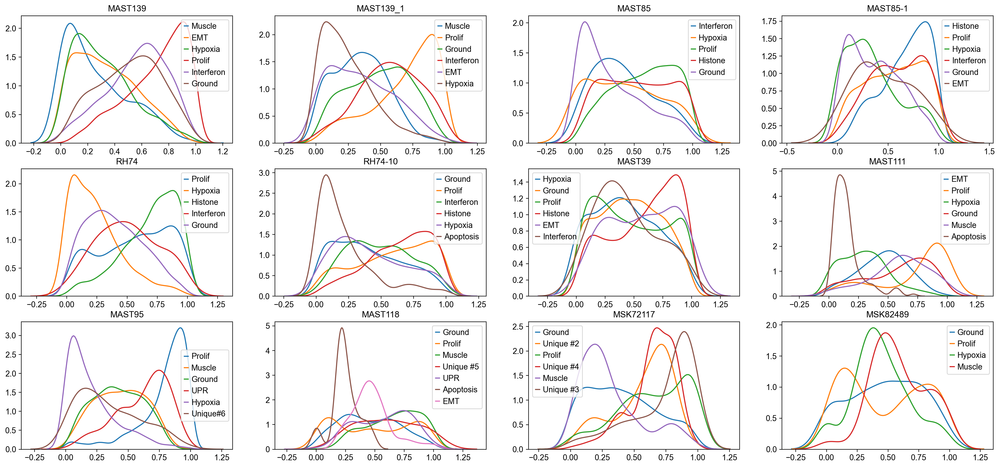

In [209]:
fig, ax = plt.subplots(3, 4)
fig.set_size_inches(24, 11)
ax = ax.flatten()
for i, cyto in enumerate(cytos):
    for c in cyto.Phenotype.unique():
        sub = cyto.loc[cyto.Phenotype==c, :]
        sns.kdeplot(sub.CytoTRACE, label=c, ax=ax[i])
        ax[i].set_title(datas[i])

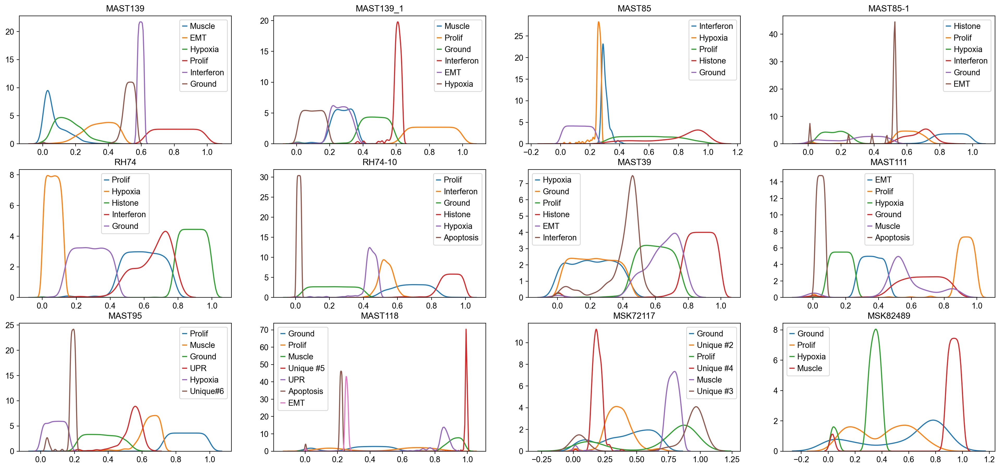

In [262]:
fig, ax = plt.subplots(3, 4)
fig.set_size_inches(24, 11)
ax = ax.flatten()
for i, loom in enumerate(looms):
    for c in loom.obs.Phenotype.unique():
        sub = loom.obs.loc[loom.obs.Phenotype==c, :]
        sns.kdeplot(sub.cytotrace, label=c, ax=ax[i])
        ax[i].set_title(datas[i])

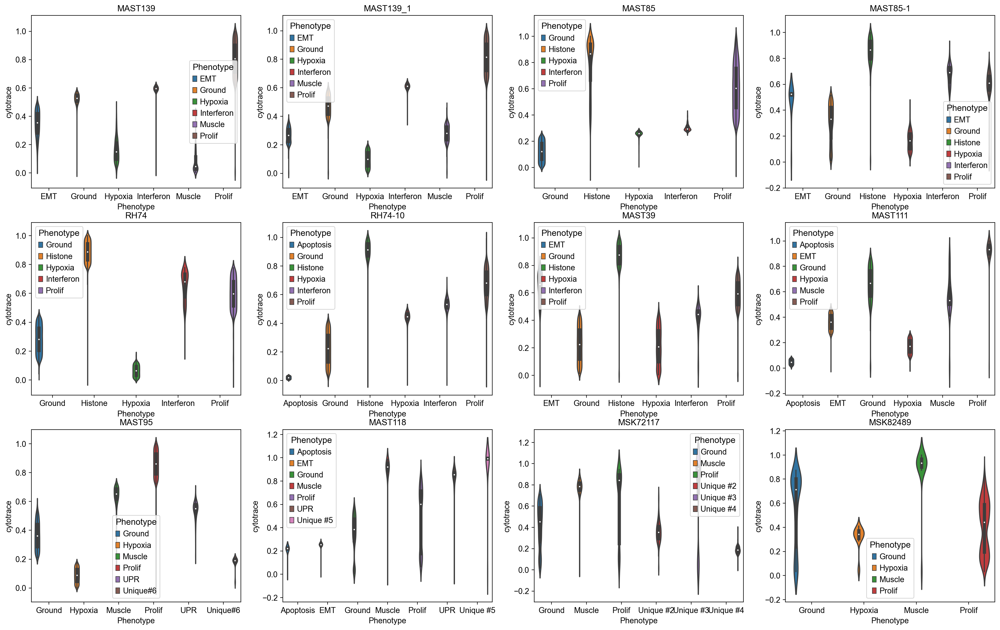

In [233]:
fig, ax = plt.subplots(3, 4)
fig.set_size_inches(24, 15)
ax = ax.flatten()
for i, loom in enumerate(looms):
#     for c in loom.obs.Phenotype.unique():
#         sub = loom.obs.loc[loom.obs.Phenotype==c, :]
    sns.violinplot(x='Phenotype', y='cytotrace', hue='Phenotype', data=loom.obs, label=c, ax=ax[i])
    ax[i].set_title(datas[i])

In [237]:
color_dict = {
    'Ground':  '#773E14',
    'Hypoxia': "#EC8528",
    'UPR':  '#F1FA64',
    'EMT':  '#3B1673',
    'Prolif': '#1440D8',
    'Muscle': '#E12727',
    'Histone': '#E24B8F',
    'Apoptosis': '#9E3CC8', 
    'Interferon': '#489F4B',
    'Unique#6': 'gray',
    'Unique#7': 'gray',
    'Unique#8': 'gray',
    'Unique #5': 'gray',
    'Unique #1': 'gray',
    'Unique #2': 'gray',
    'Unique #3': 'gray',
    'Unique #4': 'gray'    
}

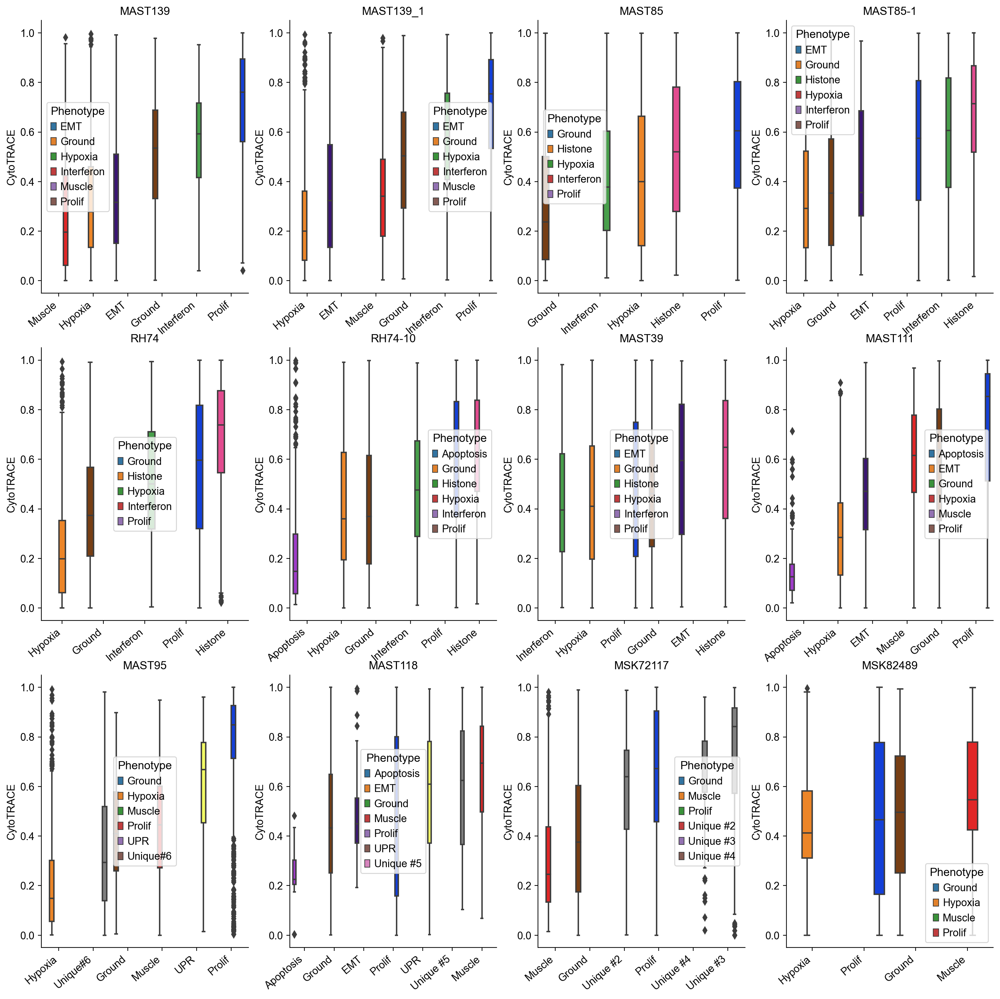

In [260]:
fig, ax = plt.subplots(3, 4)
fig.set_size_inches(18, 18)
ax = ax.flatten()
for i, loom in enumerate(looms):
#     for c in loom.obs.Phenotype.unique():
#         sub = loom.obs.loc[loom.obs.Phenotype==c, :]
    result_cyto = loom.obs
    order = result_cyto.groupby('Phenotype').median().sort_values(['CytoTRACE']).index

    bplot = sns.boxplot(x='Phenotype', y='CytoTRACE', hue='Phenotype', data=result_cyto, 
                        ax=ax[i], order=order)
    for j in range(0,len(order)):
        mybox = bplot.artists[j]
        mybox.set_facecolor(color_dict[order[j]])
    sns.despine()
    #bplot._legend.remove()
    ax[i].set_xlabel('')
    ax[i].set_xticklabels(order,
                          rotation=40, ha='right')    
    ax[i].set_title(datas[i])

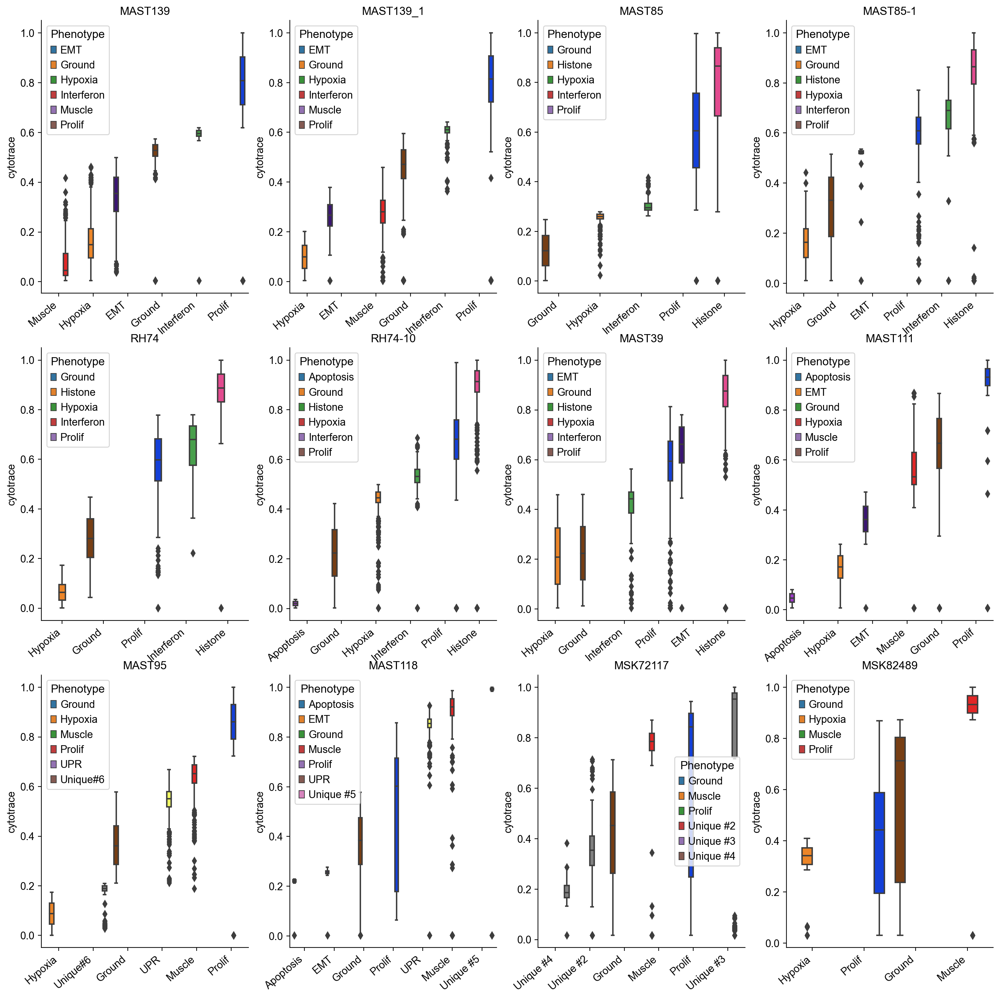

In [261]:
fig, ax = plt.subplots(3, 4)
fig.set_size_inches(18, 18)
ax = ax.flatten()
for i, loom in enumerate(looms):
#     for c in loom.obs.Phenotype.unique():
#         sub = loom.obs.loc[loom.obs.Phenotype==c, :]
    result_cyto = loom.obs
    order = result_cyto.groupby('Phenotype').median().sort_values(['cytotrace']).index

    bplot = sns.boxplot(x='Phenotype', y='cytotrace', hue='Phenotype', data=result_cyto, 
                        ax=ax[i], order=order)
    for j in range(0,len(order)):
        mybox = bplot.artists[j]
        mybox.set_facecolor(color_dict[order[j]])
    sns.despine()
    ax[i].set_xlabel('')    
    #bplot._legend.remove()
    ax[i].set_xticklabels(order,
                          rotation=40, ha='right')    
    ax[i].set_title(datas[i])

## Down sampling for exploring gene set again

In [192]:
from dive.utils import downsample

In [194]:
import re
import os

cytos = []
looms = []
for d in datas:
    print(d)
    print(glob(f'/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/*{d}*loom.h5ad'))
    print(glob(f'/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/{d}*_cytotraceCytoTRACE_plot_table.txt')) 

    if os.path.exists("%s_cytotrace_eachcellstate_down.h5ad" % d):
        loom = sc.read("%s_cytotrace_eachcellstate_down.h5ad" % d)
    else:
        if d=='MAST139' or d=='MAST85':
            loom = sc.read(glob(f'/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/*{d}*loom.h5ad')[-1])
        else:
            loom = sc.read(glob(f'/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/*{d}*loom.h5ad')[0])
        downsample(loom)
        del loom.layers        
        selection = np.load(glob(f'/PHShome/qq06/projects/01_sc_rms/results/velocity_dynamical/*{d}*npy')[0])

        cyto = pd.read_table(glob(f'/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/{d}*_cytotraceCytoTRACE_plot_table.txt')[0])
        cyto.index = cyto.index.map(lambda x:x.split('_')[0])    
        loom.obs.index = loom.obs.index.map(lambda x: re.sub('.*:', '', x).replace('x', ''))
        print(loom.shape, selection.shape, cyto.shape)
        loom.obs = pd.concat([loom.obs, cyto.loc[loom.obs.index.map(lambda x: re.sub('.*:', '', x).replace('x', '')), :]]
               , axis=1)
        compare_cytotrace(loom, condition='Phenotype', layer='X')
        loom.write("%s_cytotrace_eachcellstate_down.h5ad" % d)
        #break
        
    cytos.append(cyto)
    looms.append(loom)
#    break

MAST139
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/MAST139_1cells_vel_vel.loom.h5ad', '/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190624_seurat-object_MAST139_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST139_cytotraceCytoTRACE_plot_table.txt', '/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST139-1_cytotraceCytoTRACE_plot_table.txt', '/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST139_1_cytotraceCytoTRACE_plot_table.txt']
(6515, 17361) (6515, 17361)
(6515, 17361) (6515,) (6515, 5)
[-0.00617101  0.00975283 -0.00799742 ... -0.00109312  0.02393589
 -0.00463637]
[[1.60715825 0.         0.77481849 ... 1.87196195 0.         2.50250034]
 [1.89866583 0.         2.39666606 ... 1.58266443 0.76301414 0.        ]
 [0.75032398 0.50927815 0.77481849 ... 1.87196195 0.         1.22239242]
 ...
 [0.75032398 0.         0.77481849 ... 0.73558719 0.         1.5849625 ]
 [0.         0.50927815 0.77481849 ... 0.

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_EMT' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Interferon' as categorical
... storing 'cytotrace_corrs_Muscle' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical


MAST139_1
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/MAST139_1cells_vel_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST139_1_cytotraceCytoTRACE_plot_table.txt']
(5578, 17959) (5578, 17959)
(5578, 17959) (5579,) (5579, 5)
[-0.04055276  0.05327621  0.00319332 ...  0.00897594  0.04560519
  0.00269164]
[[1.1551125  1.49536506 0.6015348  ... 1.43663975 1.0396562  0.64512945]
 [1.50615777 0.68387753 0.         ... 1.43663975 0.         2.13201005]
 [1.1551125  1.77644365 0.         ... 1.43663975 0.         0.64512945]
 ...
 [0.         0.         0.         ... 0.64981365 0.         0.        ]
 [0.         0.68387753 0.         ... 0.         0.         0.        ]
 [0.         0.68387753 0.         ... 0.         0.         0.        ]]
[0.56577292 0.50084925 0.24551328 ... 0.42690097 0.27571297 0.34218211]
preprocessing: 14.545875072479248
markov: 0.011444330215454102
score time: 2.1164422035217285
final time: 0.10049891471862793
prepr

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_EMT' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Interferon' as categorical
... storing 'cytotrace_corrs_Muscle' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical


MAST85
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190801_MAST85-1cell_vel.loom.h5ad', '/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190624_seurat-object_MAST85_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST85_cytotraceCytoTRACE_plot_table.txt', '/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST85-1_cytotraceCytoTRACE_plot_table.txt']
(7423, 17521) (7423, 17521)
(7423, 17521) (4606,) (7423, 5)
[ 0.00871249  0.00496098 -0.01404361 ...  0.00390696 -0.0108575
 -0.01647891]
[[0.         3.37433403 2.23974946 ... 1.98754826 0.80815168 1.67177513]
 [0.79323381 0.         0.80292116 ... 0.         0.         0.78967744]
 [0.         0.         2.23974946 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.78304902 0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.      

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Histone' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Interferon' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical


MAST85-1
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190801_MAST85-1cell_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST85-1_cytotraceCytoTRACE_plot_table.txt']
(4607, 17213) (4607, 17213)
(4607, 17213) (4606,) (4607, 5)
[ 0.01377095  0.0200038  -0.01312697 ... -0.0524322   0.02140873
  0.00226743]
[[1.93496472 1.8482546  1.18024328 ... 2.34004126 1.08790709 3.3587587 ]
 [1.93496472 0.72260659 1.5356672  ... 1.890945   0.         1.27762563]
 [0.77055163 0.         0.70759099 ... 1.60007256 0.         2.58144466]
 ...
 [0.77055163 0.         0.         ... 1.23535356 0.         0.77584973]
 [0.         0.         0.         ... 0.74605061 0.64415829 0.77584973]
 [0.         0.         0.70759099 ... 0.         0.         0.77584973]]
[0.46857575 0.20035969 0.42025678 ... 0.54768775 0.11802302 0.5647242 ]
preprocessing: 12.256858348846436
markov: 0.002264261245727539
score time: 0.0068759918212890625
final time: 0.028177738189697266


... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_EMT' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Histone' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Interferon' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical


RH74
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190624_seurat-object_RH74_vel.loom.h5ad', '/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/RH74-10cells_vel_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/RH74_cytotraceCytoTRACE_plot_table.txt', '/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/RH74-10_cytotraceCytoTRACE_plot_table.txt']
(5435, 16243) (5435, 16243)
(5435, 16243) (8053,) (5435, 5)
[ 0.0098429   0.03346331 -0.01142096 ...  0.00781799  0.00048022
 -0.01577079]
[[2.67788004 3.67904503 2.42920483 ... 3.43911163 3.00893041 1.55513829]
 [1.59678292 0.         2.25077925 ... 1.93099721 2.27657911 1.84190279]
 [1.23253013 0.69733543 0.70182973 ... 1.93099721 2.27657911 1.84190279]
 ...
 [0.         0.         0.         ... 0.76832977 0.         0.        ]
 [0.         0.         0.         ... 0.76832977 0.71446928 0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]
[0.245

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Histone' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Interferon' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical


RH74-10
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/RH74-10cells_vel_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/RH74-10_cytotraceCytoTRACE_plot_table.txt']
(8053, 16552) (8053, 16552)
(8053, 16552) (8053,) (8054, 5)
[0.01865236 0.01896275 0.02233222 ... 0.00146813 0.0031973  0.00497071]
[[4.1165017  1.81033095 1.53373718 ... 1.47726305 1.4900396  1.98738995]
 [4.67346991 2.73145731 2.87141579 ... 3.81599917 4.4662756  3.12258885]
 [0.66336565 1.81033095 0.70644917 ... 1.13057966 0.68076448 0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]
[0.44530857 0.28258104 0.4200251  ... 0.38429133 0.38025042 0.33426818]
preprocessing: 14.25227975845337
markov: 0.007992744445800781
score time: 7.319500923156738
final time: 0.1865997314453125
preprocessing: 22.030

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_Apoptosis' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Histone' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Interferon' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical


MAST39
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190624_seurat-object_MAST39_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST39_cytotraceCytoTRACE_plot_table.txt']
(10577, 16182) (10577, 16182)
(10577, 16182) (10577,) (10577, 5)
[ 0.00185031  0.03717325  0.00316404 ...  0.01532243  0.01614233
 -0.01744581]
[[1.85653129 3.29811164 2.80898539 ... 2.44535957 3.07051797 2.89141919]
 [3.92175429 2.82271731 2.91725792 ... 3.22302102 4.38716217 2.66675659]
 [1.36334802 1.91124481 1.39973025 ... 1.68854156 3.07051797 2.07382023]
 ...
 [0.         1.07350082 0.         ... 0.         1.096651   0.        ]
 [0.         0.         0.62870282 ... 0.         0.         0.        ]
 [0.60812022 0.         0.         ... 0.         0.         0.        ]]
[0.20121537 0.24293448 0.18816568 ... 0.28029577 0.41768084 0.26027526]
preprocessing: 26.148946285247803
markov: 0.004927396774291992
score time: 5.435689210891724
final time: 0.06179952621459

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_EMT' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Histone' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Interferon' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical


MAST111
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190624_seurat-object_MAST111_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST111_cytotraceCytoTRACE_plot_table.txt']
(2199, 16916) (2199, 16916)
(2199, 16916) (2199,) (2199, 5)
[ 0.05918019  0.02316916  0.01168483 ...  0.01223565 -0.02130183
  0.03060679]
[[0.         0.         0.         ... 0.         1.55859889 0.        ]
 [0.         1.28516558 0.73979626 ... 1.17705447 1.19982466 0.        ]
 [2.47772152 2.59212229 1.22643453 ... 1.53192774 3.23745112 1.44975229]
 ...
 [0.         1.28516558 0.         ... 0.         0.         0.65736911]
 [0.65193233 0.         0.73979626 ... 0.         0.72120531 0.65736911]
 [0.65193233 0.         0.73979626 ... 0.         0.         0.        ]]
[0.35402573 0.67537937 0.46228397 ... 0.59462648 0.84543252 0.34669537]
preprocessing: 3.4684672355651855
markov: 0.004283428192138672
score time: 1.5074846744537354
final time: 0.018394470214843

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_Apoptosis' as categorical
... storing 'cytotrace_corrs_EMT' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Muscle' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical


MAST35
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190624_seurat-object_MAST35_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST35_cytotraceCytoTRACE_plot_table.txt']
(3595, 17945) (3595, 17945)
(3595, 17945) (3595,) (3595, 5)
[-0.04086429  0.03113574  0.00339299 ...  0.01692958  0.01298322
  0.00159654]
[[1.95949034 2.45016572 2.42025521 ... 0.76443387 2.78996479 3.39698188]
 [0.78434601 0.80250878 0.         ... 1.26147459 0.79868606 1.97582804]
 [1.28961187 2.23898775 0.78696668 ... 0.         0.         1.67814159]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.78696668 ... 0.         0.79868606 0.        ]
 [0.         0.80250878 0.         ... 0.         0.         0.        ]]
[0.31185048 0.64849122 0.34561642 ... 0.29364072 0.38878186 0.53252018]
preprocessing: 7.41306471824646
markov: 0.10385513305664062
score time: 25.955775499343872
final time: 0.25482821464538574
pre

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Histone' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Interferon' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical


MSK74711
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20191031_MSK74711_cellranger_vel_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MSK74711_cytotraceCytoTRACE_plot_table.txt']
(2105, 17789) (2105, 17789)
(2105, 17789) (2105,) (2105, 5)
[ 0.02187128 -0.00170059  0.00184108 ...  0.03156865  0.01364665
  0.01488571]
[[3.14204107 0.         2.20954138 ... 2.99148339 3.92002144 2.94893181]
 [2.29685693 0.87865518 1.49192546 ... 2.05672745 2.12630799 2.94893181]
 [0.         0.87865518 1.77266893 ... 1.53418564 2.12630799 1.15194986]
 ...
 [0.72448447 0.         0.         ... 0.         0.         1.15194986]
 [0.         0.         0.         ... 0.         0.74260774 0.68801928]
 [0.         0.         0.         ... 1.17897974 1.23044589 0.        ]]
[0.48232123 0.19012974 0.42580017 ... 0.5633845  0.74067425 0.55919961]
preprocessing: 4.2350053787231445
markov: 0.026063919067382812
score time: 19.454689502716064
final time: 0.17859745025

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_EMT' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Interferon' as categorical
... storing 'cytotrace_corrs_Muscle' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical
... storing 'cytotrace_corrs_Unique #1' as categorical


MAST95
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190624_seurat-object_MAST95_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST95_cytotraceCytoTRACE_plot_table.txt']
(4771, 14219) (4771, 14219)
(4771, 14219) (4771,) (4771, 5)
[0.024445   0.00181342 0.04396802 ... 0.05469428 0.05716671 0.01208429]
[[0.         3.39837325 3.01138839 ... 3.12054024 0.         2.53167581]
 [0.62480784 3.39837325 3.46028179 ... 1.75204173 1.30366107 2.80282126]
 [0.         2.83502182 1.46772299 ... 2.90938151 0.         2.80282126]
 ...
 [0.62480784 0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         1.89797801 0.         ... 0.         0.         0.67609018]]
[0.30238439 0.61130791 0.33170552 ... 0.37589411 0.23680155 0.44535498]
preprocessing: 10.391443014144897
markov: 0.07355451583862305
score time: 27.458608150482178
final time: 0.4699263572692871
preproces

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Muscle' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical
... storing 'cytotrace_corrs_UPR' as categorical
... storing 'cytotrace_corrs_Unique#6' as categorical


MAST118
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/MAST118_vel_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MAST118_cytotraceCytoTRACE_plot_table.txt']
(3516, 16676) (3516, 16676)
(3516, 16676) (3516,) (3516, 5)
[ 0.00221714  0.02758886  0.02897129 ...  0.14715568 -0.05452626
  0.0095681 ]
[[1.72752169 2.7645069  0.         ... 1.92539103 1.21186766 3.56031353]
 [3.43619308 4.42937935 0.         ... 4.8915931  4.46348972 4.32574836]
 [3.08960828 1.36764917 0.         ... 2.86718387 3.68339981 3.70784713]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.7651948  0.         0.        ]
 [0.         0.61054176 0.         ... 1.26255279 0.         0.70937976]]
[0.52069891 0.45447282 0.04203973 ... 0.85189644 0.91661648 1.02323371]
preprocessing: 8.092039823532104
markov: 0.002282857894897461
score time: 0.004010915756225586
final time: 0.002856731414794922
preprocessing:

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_Apoptosis' as categorical
... storing 'cytotrace_corrs_EMT' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Muscle' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical
... storing 'cytotrace_corrs_UPR' as categorical
... storing 'cytotrace_corrs_Unique #5' as categorical


MSK72117
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20191031_MSK72117tencell_cellranger_vel_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MSK72117_cytotraceCytoTRACE_plot_table.txt']
(3443, 17793) (3443, 17793)
(3443, 17793) (3443,) (3443, 5)
[ 0.01129715 -0.0063657  -0.00265711 ... -0.06960039  0.01075848
 -0.01046235]
[[4.68727456 3.53359327 2.23935353 ... 4.09427003 3.58422185 4.57927294]
 [1.98114892 2.46842396 2.03616755 ... 2.61958407 2.08184497 2.44727621]
 [1.46928389 0.58863282 0.69626901 ... 1.83708113 2.90052202 2.06396006]
 ...
 [0.         0.         0.         ... 0.         0.7195747  0.        ]
 [0.         0.58863282 0.         ... 0.         2.90052202 0.71040636]
 [1.12381813 0.         0.69626901 ... 0.7165222  0.7195747  0.        ]]
[0.59311058 0.48877295 0.54837177 ... 0.84150742 0.94290998 1.03933305]
preprocessing: 8.725038051605225
markov: 0.09699606895446777
score time: 27.897111654281616
final time: 0.337404

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Muscle' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical
... storing 'cytotrace_corrs_Unique #2' as categorical
... storing 'cytotrace_corrs_Unique #3' as categorical
... storing 'cytotrace_corrs_Unique #4' as categorical


MSK82489
['/PHShome/qq06/projects/01_sc_rms/results/seurat_intersect_velocity/20190624_seurat-object_MSK82489_vel.loom.h5ad']
['/PHShome/qq06/projects/01_sc_rms/phaseA_explore_rms/MSK82489_cytotraceCytoTRACE_plot_table.txt']
(1385, 15449) (1385, 15449)
(1385, 15449) (1385,) (1385, 5)
[ 0.00745939 -0.01002505 -0.00033076 ... -0.13684426 -0.00910545
  0.03236934]
[[3.94630528 1.09232919 0.         ... 2.44322139 4.42856426 3.76150828]
 [2.48200531 1.09232919 1.04723836 ... 2.74560391 3.73558474 3.26230062]
 [2.64200431 0.         0.61662597 ... 1.82224591 1.61043058 1.21557045]
 ...
 [0.         0.         0.         ... 0.         0.75230033 0.        ]
 [0.         0.64716709 0.         ... 0.         0.75230033 0.        ]
 [0.         0.         0.         ... 0.         0.75230033 0.        ]]
[0.62463877 0.11551759 0.06812178 ... 0.55923898 0.77585807 0.73258027]
preprocessing: 2.416999101638794
markov: 0.01209259033203125
score time: 1.4781122207641602
final time: 0.04559350013732

... storing 'Phenotype' as categorical
... storing 'cytotrace_corrs_Ground' as categorical
... storing 'cytotrace_corrs_Hypoxia' as categorical
... storing 'cytotrace_corrs_Muscle' as categorical
... storing 'cytotrace_corrs_Prolif' as categorical


In [195]:
ranks = {}
ranks2 = {}
for d, loom in zip(datas, looms):
    ranks[d] = {}
    ranks2[d] = {}    
    for i in loom.obs.Phenotype.unique():
        label='_%s' % i
        rank = pd.DataFrame(loom.var.sort_values('cytotrace_corrs%s' % label,
                                                 ascending=False).loc[:, 'cytotrace_corrs%s' % label])
        rank.insert(loc=0, column='gene', value=rank.index)  
        rank = rank.loc[rank.loc[:, 'cytotrace_corrs%s' % label]!='None', :]
        rank.loc[:, 'cytotrace_corrs%s' % label] = rank.loc[:, 'cytotrace_corrs%s' % label].astype('float32')
        rank = rank.sort_values('cytotrace_corrs%s' % label, ascending=False)
        
        rank2 = rank.sort_values('cytotrace_corrs%s' % label, ascending=False)
        
        rank = rank.loc[rank.loc[:, 'cytotrace_corrs%s' % label].astype('float32').map(abs)>=0.1, :]
        rank.loc[:, 'pos'] = rank.loc[:, 'cytotrace_corrs%s' % label].astype('float32') > 0
        rank = rank.dropna()
        
        rank = pd.concat([rank.iloc[:300, :], rank.iloc[-300:, :]], axis=0)
        rank = rank.drop_duplicates()
        rank2 = rank2.dropna()
        ranks2[d][i] = rank2
        ranks[d][i] = rank        
        print(d, i, rank2.shape, rank.shape)

MAST139 Muscle (13976, 2) (600, 3)
MAST139 EMT (15941, 2) (600, 3)
MAST139 Hypoxia (15232, 2) (600, 3)
MAST139 Prolif (16097, 2) (527, 3)
MAST139 Interferon (13328, 2) (600, 3)
MAST139 Ground (14334, 2) (600, 3)
MAST139_1 Muscle (14308, 2) (600, 3)
MAST139_1 Prolif (16108, 2) (600, 3)
MAST139_1 Ground (15605, 2) (600, 3)
MAST139_1 Interferon (12913, 2) (600, 3)
MAST139_1 EMT (13986, 2) (600, 3)
MAST139_1 Hypoxia (15278, 2) (600, 3)
MAST85 Interferon (12867, 2) (600, 3)
MAST85 Hypoxia (12918, 2) (600, 3)
MAST85 Prolif (16491, 2) (175, 3)
MAST85 Histone (15306, 2) (235, 3)
MAST85 Ground (15860, 2) (180, 3)
MAST85-1 Histone (15387, 2) (600, 3)
MAST85-1 Prolif (14885, 2) (600, 3)
MAST85-1 Hypoxia (14446, 2) (600, 3)
MAST85-1 Interferon (13072, 2) (600, 3)
MAST85-1 Ground (15843, 2) (600, 3)
MAST85-1 EMT (8008, 2) (600, 3)
RH74 Prolif (14896, 2) (353, 3)
RH74 Hypoxia (13859, 2) (600, 3)
RH74 Histone (14459, 2) (206, 3)
RH74 Interferon (11210, 2) (600, 3)
RH74 Ground (14905, 2) (231, 3)
RH74

In [196]:
for d, loom in zip(datas, looms):
    for i in loom.obs.Phenotype.unique():
        ranks2[d][i].to_csv(f'{d}_{i}_down_geneset.csv')
        ranks[d][i].to_csv(f'{d}_{i}_down_filtered_geneset.csv')

In [203]:
from functools import reduce

allpos = []
corspos = {}
for i in cols.columns:
    if i.startswith('Unique'): continue
    corspos[i] = {}        
    cors = []
    ranks_inter = []
    tumor_inter = []
    for d, loom in zip(datas[:10], looms[:10]):
        if i in ranks[d]:
            tumor_inter.append(d)
            ranks_inter.append(list(ranks[d][i].loc[ranks[d][i].pos, :].index))
            cors.append(ranks[d][i].loc[ranks[d][i].pos, :])

    if len(ranks_inter) == 0: continue
    cors = reduce(lambda x, y: pd.merge(x, y, left_index=True, right_index=True, how='inner'), cors)  
    cors = cors.loc[:, cors.columns.str.contains('cyto')]
    cors.columns = tumor_inter
    corspos[i]['pos'] = cors    
    if len(ranks_inter) != 1:
        print(i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter)))
        allpos.append([i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter))])
    #else:
    #    print(i, ranks_inter)
pd.DataFrame(allpos).to_csv('allpos_down_geneset_erms0.1.csv')

Ground MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35,MSK74711 AUTS2,PTK2,PTPRD,TTC28
Hypoxia MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35 CADM2,FAT3,HMGA2,NCOA1,NFIA,NRG1,PKNOX2,SOX6,STARD13,TCF4,TENM3,TTC28
EMT MAST139,MAST139_1,MAST85-1,MAST39,MAST111,MSK74711 ENOX1,NFIA,NRG1,STARD13
Prolif MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35,MSK74711 AUTS2,FAT3,NFIA,NRG1,PRKG1,SMYD3,TTC28,ZEB1
Apoptosis RH74-10,MAST111 BTG1,C12orf23,CPSF6,HIST1H3J,HNRNPU,HSPA1B,IER2,LINC00511,MT-ATP6,MT-CO1,MT-CO2,MT-CO3,MT-ND1,MT-ND2,MT-ND3,MT-ND4,NUMA1,PIK3R3,PPP1R10,SPRED2,USP22,ZNF143
Muscle MAST139,MAST139_1,MAST111,MSK74711 AC090044.1,ENAH,FHIT,JMJD1C
Interferon MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST35,MSK74711 
Histone MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST35 ARHGAP11B,AUTS2,BAI3,BNC2,DLG2,ENOX1,GABRG3,HMGA2,LINC00478,MAGI1,MALAT1,NCAM1,NCOA1,NFIA,NFIB,NRG1,PDE4B,PKNOX2,PTPRT,QKI,RBMS3,RGS7,RP11-138I17.1,SOX6

In [206]:
from functools import reduce

allneg = []
corsneg = {}
for i in cols.columns:
    if i.startswith('Unique'): continue
    corsneg[i] = {}        
    cors = []
    ranks_inter = []
    tumor_inter = []
    for d, loom in zip(datas[:10], looms[:10]):
        if i in ranks[d]:
            tumor_inter.append(d)
            ranks_inter.append(list(ranks[d][i].loc[~ranks[d][i].pos, :].index))
            cors.append(ranks[d][i].loc[~ranks[d][i].pos, :])

    if len(ranks_inter) == 0: continue

    cors = reduce(lambda x, y: pd.merge(x, y, left_index=True, right_index=True, how='inner'), cors)  
    cors = cors.loc[:, cors.columns.str.contains('cyto')]
    cors.columns = tumor_inter
    corsneg[i]['neg'] = cors    
    
    if len(ranks_inter) != 1:
        print(i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter)))
        allneg.append([i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter))])
    #else:
    #    print(i, ranks_inter)
pd.DataFrame(allneg).to_csv('allneg_down_geneset_erms0.1.csv')

Ground MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35,MSK74711 GAPDH,RPL12,RPS5,RPS6
Hypoxia MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35 ACTG1,BTF3,EIF1,FAU,FTL,GAPDH,GNB2L1,NACA,RPL10A,RPL11,RPL12,RPL13,RPL13A,RPL14,RPL18,RPL19,RPL23,RPL23A,RPL24,RPL27A,RPL28,RPL29,RPL30,RPL32,RPL34,RPL35A,RPL36,RPL37,RPL37A,RPL4,RPL5,RPL7A,RPL8,RPLP0,RPLP1,RPLP2,RPS11,RPS12,RPS13,RPS14,RPS15A,RPS16,RPS18,RPS19,RPS21,RPS23,RPS24,RPS27A,RPS3,RPS4X,RPS5,RPS6,RPS7,RPS8,RPSA,SLC25A6,TPT1,UBA52,VIM,ZFAS1
EMT MAST139,MAST139_1,MAST85-1,MAST39,MAST111,MSK74711 
Prolif MAST139,MAST139_1,MAST85,MAST85-1,RH74,RH74-10,MAST39,MAST111,MAST35,MSK74711 RPL11
Apoptosis RH74-10,MAST111 ACTG1,BTF3,FAU,FTL,GAPDH,GNB2L1,IGFBP2,LDHB,NACA,RARS2,RP11-17A1.3,RP11-337C18.8,RPL10A,RPL11,RPL12,RPL13,RPL18,RPL19,RPL23,RPL23A,RPL27A,RPL28,RPL29,RPL30,RPL31,RPL32,RPL34,RPL35A,RPL37,RPL5,RPL7A,RPL8,RPLP1,RPS11,RPS12,RPS13,RPS14,RPS15A,RPS16,RPS18,RPS19,RPS23,RPS24,RPS27A,RPS3,RPS4X,RPS

In [208]:
corsneg

{'Ground': {'neg':         MAST139  MAST139_1    MAST85  MAST85-1      RH74   RH74-10    MAST39  \
  RPL12 -0.284237  -0.202158 -0.114659 -0.275772 -0.101497 -0.168898 -0.181201   
  RPS5  -0.308990  -0.297696 -0.150632 -0.285437 -0.102992 -0.207151 -0.252473   
  RPS6  -0.309300  -0.131122 -0.145045 -0.327460 -0.115963 -0.206383 -0.209619   
  GAPDH -0.372930  -0.222332 -0.108660 -0.391551 -0.281630 -0.217040 -0.223845   
  
          MAST111    MAST35  MSK74711  
  RPL12 -0.291715 -0.142334 -0.376064  
  RPS5  -0.370339 -0.188420 -0.339333  
  RPS6  -0.350357 -0.160495 -0.431308  
  GAPDH -0.480836 -0.268814 -0.320693  },
 'Hypoxia': {'neg':           MAST139  MAST139_1    MAST85  MAST85-1      RH74   RH74-10  \
  RPL23   -0.133475  -0.276606 -0.230599 -0.153919 -0.304188 -0.246019   
  ZFAS1   -0.148095  -0.279809 -0.189366 -0.282965 -0.235242 -0.236613   
  SLC25A6 -0.156063  -0.194678 -0.286492 -0.188128 -0.311175 -0.249042   
  RPS7    -0.159381  -0.314900 -0.331322 -0.418571 -0.

In [209]:
from functools import reduce

allpos = []
corspos = {}
for i in cols.columns:
    if i.startswith('Unique'): continue
    corspos[i] = {}        
    cors = []
    ranks_inter = []
    tumor_inter = []
    for d, loom in zip(datas[10:], looms[10:]):
        if i in ranks[d]:
            tumor_inter.append(d)
            ranks_inter.append(list(ranks[d][i].loc[ranks[d][i].pos, :].index))
            cors.append(ranks[d][i].loc[ranks[d][i].pos, :])

    if len(ranks_inter) == 0: continue

    cors = reduce(lambda x, y: pd.merge(x, y, left_index=True, right_index=True, how='inner'), cors)  
    cors = cors.loc[:, cors.columns.str.contains('cyto')]
    cors.columns = tumor_inter
    corspos[i]['pos'] = cors    
    if len(ranks_inter) != 1:
        print(i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter)))
        allpos.append([i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter))])
    #else:
    #    print(i, ranks_inter)
pd.DataFrame(allpos).to_csv('allpos_down_geneset_arms0.1.csv')

Ground MAST95,MAST118,MSK72117,MSK82489 AGAP1,ALK,ANK2,ANKS1B,ARHGAP26,ARHGAP6,AUTS2,CACNA2D3,CADM2,CDH13,CELF2,CSMD1,DST,EIF4G3,FBXL7,GPHN,IMMP2L,JARID2,JMJD1C,KIAA1217,KLF12,LARGE,LRFN5,MAGI1,MT-ATP6,MT-CO1,MT-CO2,MT-CO3,MT-ND1,MT-ND2,MT-ND3,MT-ND4,MYO18B,MYO1E,NAV2,NCAM1,NCOA1,NFIA,NOS1,PARD3,PTPRD,PTPRT,RC3H1,RERE,RFWD2,RNF150,SETBP1,SLC24A3,SLC38A1,SPATS2L,SSH2,STAG1,SVIL,TCF12,XRN1,ZFAND3,ZSWIM6
Hypoxia MAST95,MSK82489 ABAT,AC016831.7,ACACA,ADAM12,AGAP1,AKT3,ALK,ANK2,ANKS1B,ARHGAP26,ARID1B,ASTN2,AUTS2,CACNA2D3,CADM2,CD47,CDH13,CDK6,CELF2,CENPF,CLCN5,COL25A1,CSMD1,DISC1,DLG1,EBF1,ELMO1,ENAH,ERC1,EXOC4,EYA2,FAT3,FBXL7,GIT2,GPC6,GPHN,GPM6B,GSK3B,INVS,JMJD1C,KCNN3,KCNQ1OT1,KIAA0922,KIAA1217,KIF26B,KIRREL3,L2HGDH,LARGE,LRFN5,MAGI1,MED13L,MPPED2,MT-CO1,MT-ND3,MT-ND4,MYO18B,NAV1,NAV2,NCAM1,NCOA1,NES,NFIA,NRCAM,OTUD7A,PARD3,PARM1,PCDH7,PPAP2A,PTPRD,PTPRG,PTPRT,RAPH1,RERE,RNF150,SAMD4A,SDK1,SLC24A3,SLC38A1,SMARCC1,SORCS1,SPATS2L,SSBP2,SSH2,STAG1,STARD13,TANC2,TCF12,TMEM132D,TNIK,TTN,TULP4

In [210]:
from functools import reduce

allneg = []
corsneg = {}
for i in cols.columns:
    if i.startswith('Unique'): continue
    corsneg[i] = {}        
    cors = []
    ranks_inter = []
    tumor_inter = []
    for d, loom in zip(datas[10:], looms[10:]):
        if i in ranks[d]:
            tumor_inter.append(d)
            ranks_inter.append(list(ranks[d][i].loc[~ranks[d][i].pos, :].index))
            cors.append(ranks[d][i].loc[~ranks[d][i].pos, :])

    if len(ranks_inter) == 0: continue

    cors = reduce(lambda x, y: pd.merge(x, y, left_index=True, right_index=True, how='inner'), cors)  
    cors = cors.loc[:, cors.columns.str.contains('cyto')]
    cors.columns = tumor_inter
    corspos[i]['neg'] = cors    
    
    if len(ranks_inter) != 1:
        print(i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter)))
        allneg.append([i, ','.join(tumor_inter), ','.join(reduce(np.intersect1d, ranks_inter))])
    #else:
    #    print(i, ranks_inter)
pd.DataFrame(allneg).to_csv('allneg_down_geneset_arms0.1.csv')

Ground MAST95,MAST118,MSK72117,MSK82489 ACTC1,ALDOA,ATP5O,ENO1,GAPDH,MYOG,RPL11,RPL12,RPL13,RPL14,RPL19,RPL23,RPL23A,RPL24,RPL26,RPL27A,RPL29,RPL30,RPL31,RPL32,RPL34,RPL35,RPL35A,RPL36,RPL37,RPL37A,RPL38,RPL5,RPLP1,RPLP2,RPS14,RPS15A,RPS18,RPS19,RPS24,RPS3,RPS4X,RPS5,RPS6,RPS7,RPS8,TNNI1,TPT1,VIM
Hypoxia MAST95,MSK82489 ACTG1,ALDOA,ALKBH5,ATP5E,ATP5G2,ATP5J,ATP5L,BHLHE40,BNIP3,BTF3,BTG1,COX7C,DDIT4,EIF1,EIF4A2,ENO1,EPB41L4A-AS1,FAU,FTL,GAPDH,GNB2L1,HSPB1,KRT10,LDHA,MIF,MRFAP1,MYOG,NACA,NPM1,NRN1,OSER1,PFDN5,RPL10A,RPL11,RPL12,RPL13,RPL13A,RPL14,RPL15,RPL18,RPL18A,RPL19,RPL23,RPL23A,RPL24,RPL27,RPL27A,RPL28,RPL29,RPL30,RPL31,RPL32,RPL34,RPL35,RPL35A,RPL36,RPL37,RPL37A,RPL38,RPL5,RPL6,RPL7A,RPL8,RPLP0,RPLP1,RPLP2,RPS11,RPS12,RPS13,RPS14,RPS15,RPS15A,RPS16,RPS18,RPS19,RPS2,RPS20,RPS21,RPS23,RPS24,RPS27,RPS27A,RPS3,RPS4X,RPS5,RPS6,RPS7,RPS8,RPS9,RPSA,SEC61G,SH3BGRL3,SLC25A6,TMA7,TMSB10,TNNI1,TPI1,TPT1,TXNRD1,UBA52,UXT,ZFAS1
Prolif MAST95,MAST118,MSK72117,MSK82489 BTF3,EEF2,FAU,GAPDH,GNB2L1